In [3949]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

# data

In [3950]:
np.random.seed(42)

In [3951]:
N_CLUSTER = 5

In [3952]:
CORRELATION = 0.9

In [3953]:
NOISE_STD = 5

In [3954]:
N_SAMPLE = 2500

In [3955]:
N_FEATURES = 15

In [3956]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[5.0, 2.5, 0.5, 2.5, 0.5],
                             separation_factor=2.0,
                             sample_distribution=[1000,500,500,250,250],
                             random_state=42)

In [3957]:
X.shape

(2500, 16)

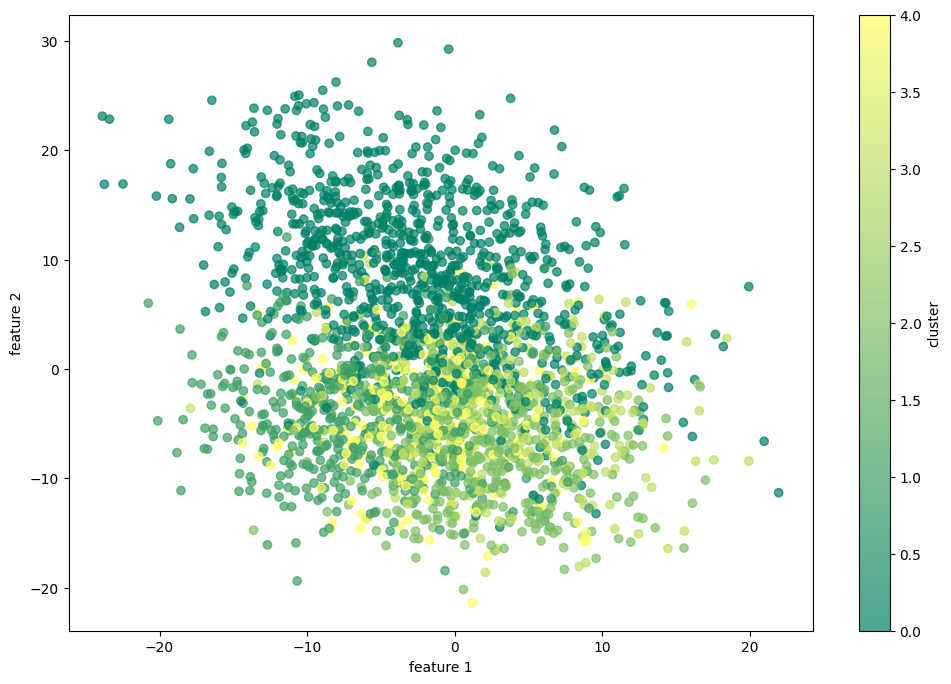

In [3958]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'],c=X['target'],cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

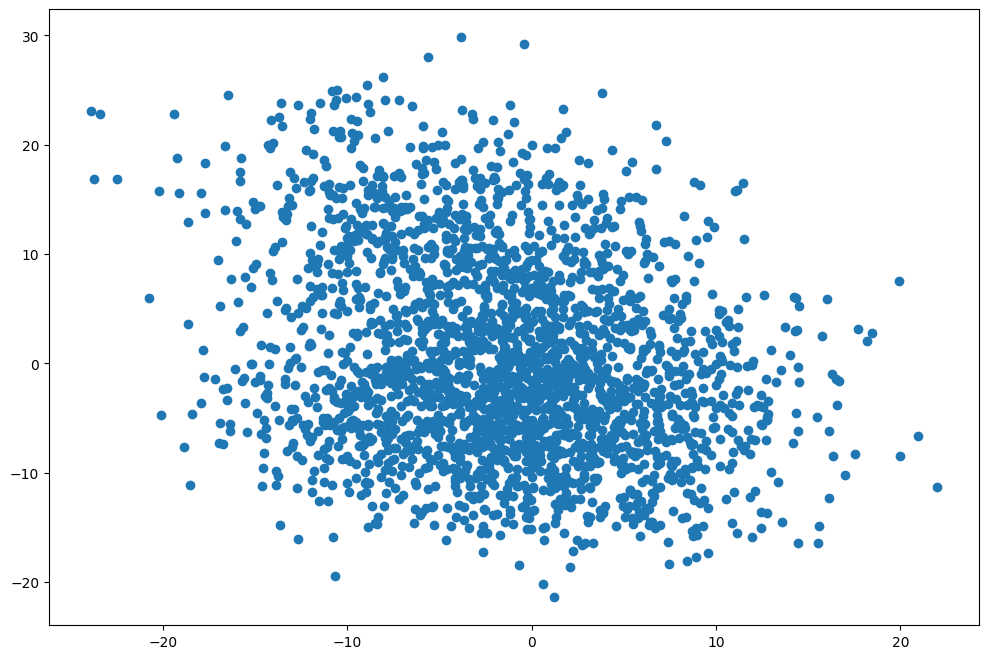

In [3959]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [3960]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [3961]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15
var_1,1.000000,-0.253159,-0.308241,0.228920,0.004590,0.025096,0.364806,-0.126541,0.177820,0.065615,-0.062606,-0.136700,-0.338978,-0.029379,0.243545
var_2,-0.253159,1.000000,0.417440,-0.147914,-0.234881,-0.419607,-0.357628,0.498637,0.071030,0.091803,-0.381779,0.565736,0.605681,-0.365664,-0.192747
var_3,-0.308241,0.417440,1.000000,-0.362580,-0.339862,-0.263858,-0.278944,0.504703,-0.168451,0.141101,0.018315,0.205852,0.403249,-0.248668,-0.031865
var_4,0.228920,-0.147914,-0.362580,1.000000,0.258114,0.060643,0.154817,-0.263936,0.230018,-0.143389,-0.268692,0.043035,-0.181697,0.099736,0.001151
var_5,0.004590,-0.234881,-0.339862,0.258114,1.000000,0.384460,-0.052585,-0.323089,0.054128,-0.242811,-0.119539,-0.036076,-0.279464,0.437539,-0.106661
var_6,0.025096,-0.419607,-0.263858,0.060643,0.384460,1.000000,0.199695,-0.237083,0.073537,-0.238026,0.332041,-0.423696,-0.387223,0.306265,-0.032653
var_7,0.364806,-0.357628,-0.278944,0.154817,-0.052585,0.199695,1.000000,-0.141848,0.163722,-0.029163,0.223159,-0.352164,-0.384008,-0.083531,0.210493
var_8,-0.126541,0.498637,0.504703,-0.263936,-0.323089,-0.237083,-0.141848,1.000000,0.045410,0.233832,-0.065694,0.302781,0.360557,-0.379989,-0.020462
var_9,0.177820,0.071030,-0.168451,0.230018,0.054128,0.073537,0.163722,0.045410,1.000000,-0.100264,-0.173951,0.118817,0.045145,-0.192296,-0.126912
var_10,0.065615,0.091803,0.141101,-0.143389,-0.242811,-0.238026,-0.029163,0.233832,-0.100264,1.000000,-0.006344,0.057630,0.016415,-0.138438,0.265337


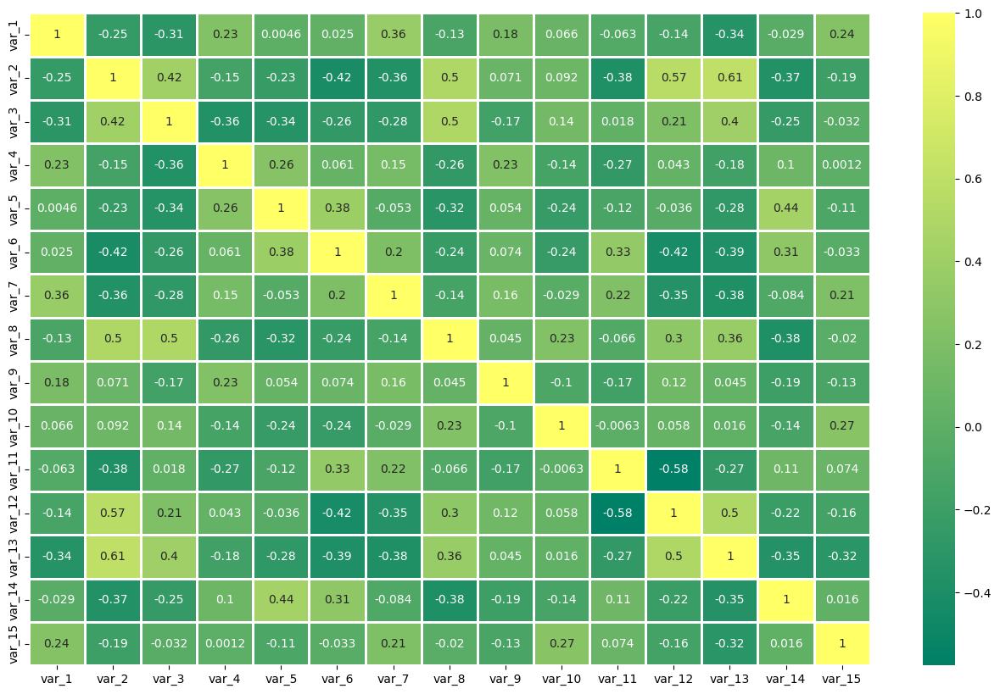

In [3962]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

In [3963]:
corr_matrix = corr_dataset.iloc[:,:-1].corr()

In [3964]:
print("Mean Absolute Correlation:", corr_matrix.abs().values[np.triu_indices_from(corr_matrix, k=1)].mean())
print("Max Correlation:", corr_matrix.max().max())
print("Min Correlation:", corr_matrix.min().min())

Mean Absolute Correlation: 0.21416090777184885
Max Correlation: 1.0
Min Correlation: -0.5766640299143612


## data standardization

In [3965]:
X_values = corr_dataset.iloc[:,:-1].values

In [3966]:
y_values = corr_dataset.iloc[:,-1].values

In [3967]:
scaler = StandardScaler()

In [3968]:
X_values = scaler.fit_transform(X_values)

In [3969]:
np.mean(X_values),np.std(X_values)

(-3.543239775657033e-17, 0.9999999999999998)

In [4462]:
X_values = pd.DataFrame(X_values)

In [4463]:
X_values

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,-0.734351,-1.093966,-1.024909,0.060999,0.097327,0.837871,0.431663,0.100971,-0.557836,-0.035877,1.015477,-0.711252,0.491439,0.790845,-0.386329
1,2.038067,-0.670145,-0.032080,2.087925,-1.616391,-1.699436,0.899443,-0.471148,-0.034778,-0.678061,-0.034432,0.390352,0.258937,-0.364741,-0.529630
2,-0.543940,0.735830,0.204364,1.815214,-0.928169,-0.773174,0.417127,-0.770167,0.219410,0.240721,0.175988,0.326953,1.144518,0.232396,0.764979
3,-1.031042,-0.159283,-0.867176,0.494764,-0.647790,-0.324961,-0.685295,-0.148026,-1.194011,0.025273,2.032501,-0.408854,0.485487,-0.042108,-1.688999
4,0.377949,0.674125,0.642655,-1.860408,0.031992,-1.468014,-0.197200,-0.078171,-0.342911,1.466690,-1.828213,-0.336579,1.330277,0.733494,-1.068350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.398658,1.097935,1.173561,0.846250,-0.191818,-0.196111,-2.121558,1.819514,0.354646,-1.380211,-0.968890,0.878936,1.951884,-1.122522,-1.297338
2496,0.426713,-0.637423,2.199120,-1.075776,-0.974532,-0.554611,0.046439,1.412868,-1.036260,0.065113,0.371283,-0.044347,-1.346648,0.313308,2.632609
2497,-1.325637,-0.385676,-0.610419,0.430050,0.502792,0.705362,-1.464511,-0.250392,0.698382,-1.144567,1.227159,-1.325796,-0.275793,-0.548115,-0.299763
2498,-0.924190,1.614779,1.424196,-1.884112,0.323782,-1.267578,-2.285060,1.429527,-1.498520,-1.447332,-2.536693,1.668679,1.519069,-0.288740,-1.251685


# dimensionality reduction algorithms

## pca 

In [3971]:
pca_general = PCA()

In [3972]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [3973]:
explained_variance = pca_general.explained_variance_ratio_

In [3974]:
explained_variance

array([0.27049877, 0.1395538 , 0.12186822, 0.08668154, 0.05748607,
       0.04704191, 0.04241205, 0.03920022, 0.03643003, 0.03277191,
       0.02868185, 0.02732591, 0.02505039, 0.02378829, 0.02120904])

In [3975]:
eigenvalues = pca_general.explained_variance_

In [3976]:
eigenvalues

array([4.05910526, 2.09414473, 1.8287548 , 1.30074333, 0.86263611,
       0.705911  , 0.63643532, 0.58823865, 0.54666907, 0.49177533,
       0.43039998, 0.41005262, 0.37590616, 0.35696719, 0.31826285])

In [3977]:
eigenvalues[1]

2.0941447298276015

In [3978]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[4.059105261290832, 2.0941447298276015, 1.8287548012518655, 1.3007433345099662]


In [3979]:
N_COMPONENTS = len(selected_components)

In [3980]:
eigenvectors = pca_general.components_

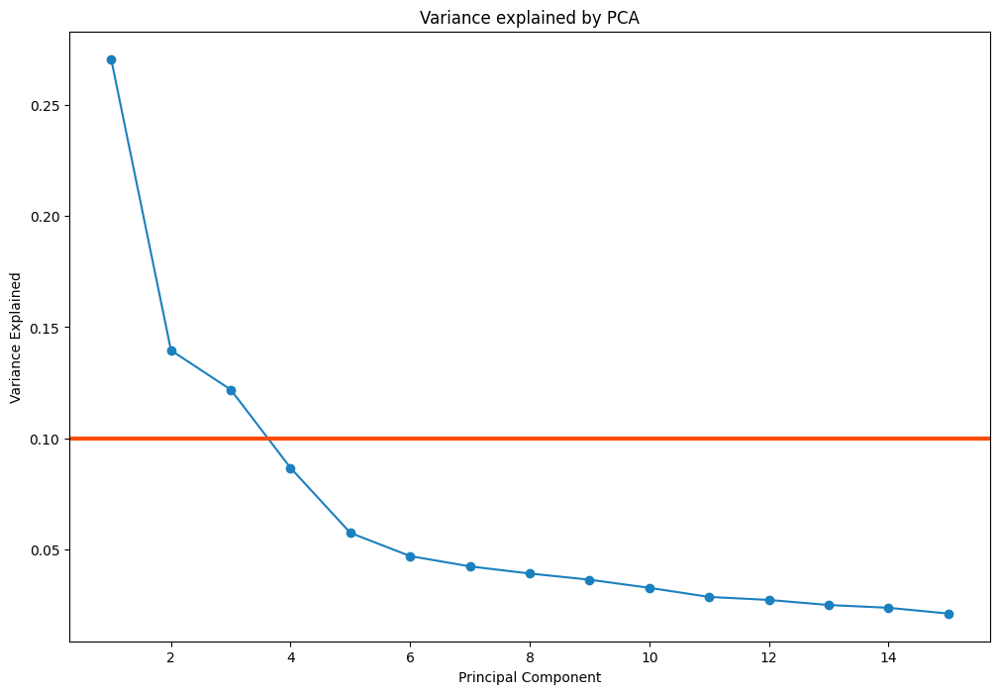

In [3981]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [3982]:
pca = PCA(n_components=N_COMPONENTS)

In [4443]:
X_pca = pca.fit_transform(X_values)

In [4444]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [4445]:
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

In [4446]:
X_pca

,dim_1,dim_2,dim_3,dim_4
0,-1.388603,0.465307,-1.143328,0.436212
1,-0.142474,-0.562371,2.396270,0.234201
2,0.687888,-0.425246,0.809689,-0.363627
3,-0.008288,0.578414,-1.665925,0.616777
4,1.986106,0.021519,-0.239403,-1.138866
...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896
2496,0.391958,3.015240,0.467748,-1.540382
2497,-0.966532,-0.242308,-1.591353,1.294384
2498,4.536698,-1.448120,-2.176720,-0.853220


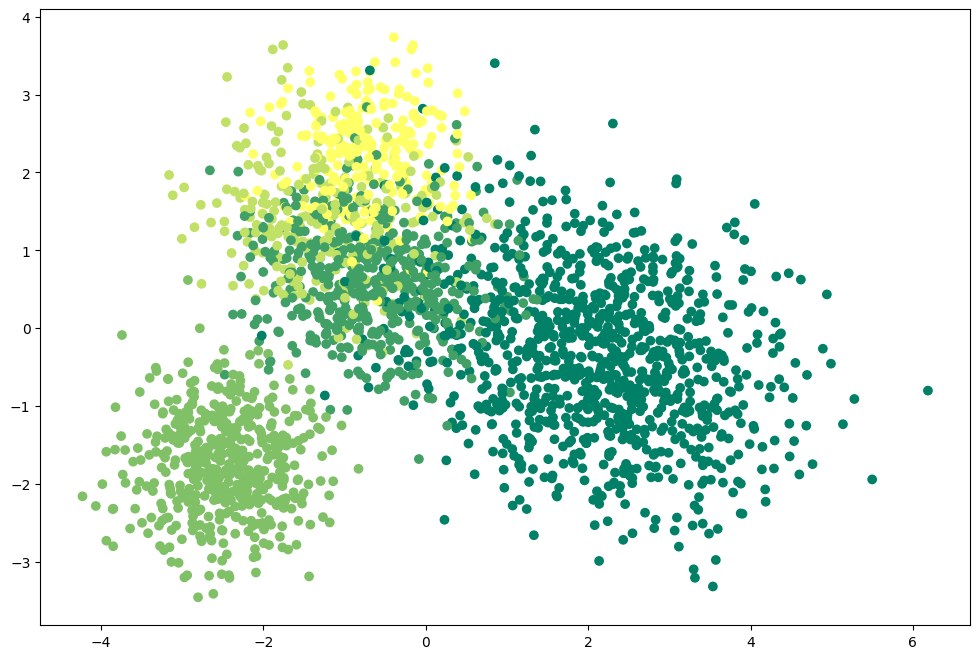

In [4448]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_pca['dim_1'],y=X_pca['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## t-SNE

In [3989]:
tsne = TSNE(n_components=3,random_state=42)

In [3990]:
X_tsne = tsne.fit_transform(X_values)

In [4441]:
X_tsne = pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3'))

In [4442]:
X_tsne 

,dim_1,dim_2,dim_3
0,-15.979687,7.722937,-2.993647
1,4.885467,13.854942,3.726759
2,9.337600,10.560486,7.206385
3,-21.735916,4.469969,-2.808877
4,6.096224,-3.138047,-9.427560
...,...,...,...
2495,10.308344,-13.613327,8.496574
2496,5.619008,4.807449,-17.887569
2497,-9.478683,1.498881,-8.726512
2498,12.414795,-16.634073,2.181808


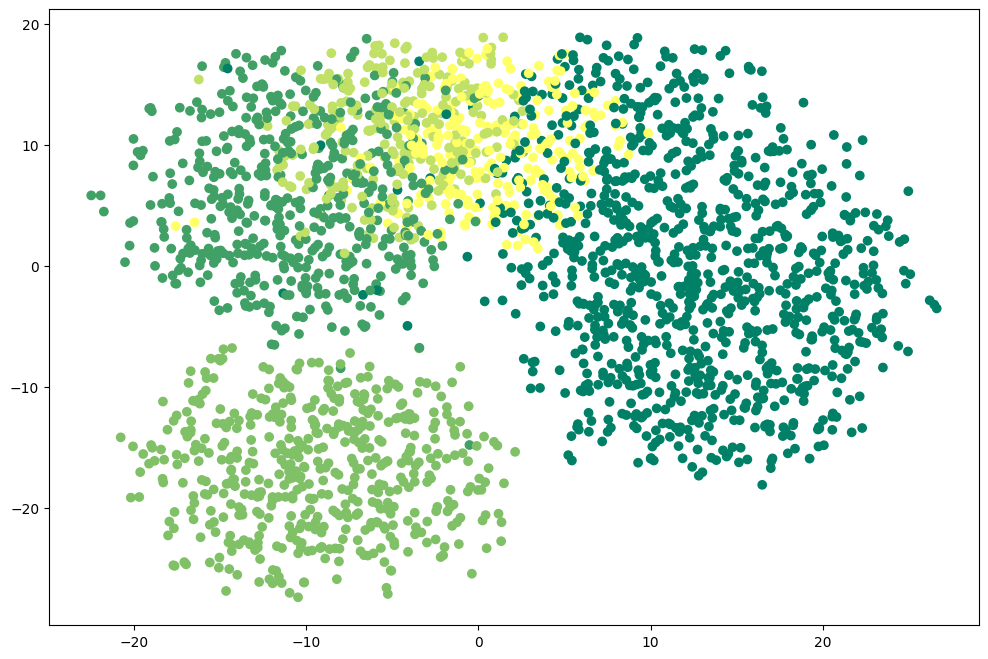

In [4449]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_tsne['dim_1'],y=X_tsne['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## umap

In [3994]:
umap = umap.UMAP(n_components=3,random_state=42)

In [3995]:
X_umap = umap.fit_transform(X_values)

In [4459]:
X_umap = pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3'))

In [4460]:
X_umap

,dim_1,dim_2,dim_3
0,1.388764,3.447327,4.915366
1,-0.225389,8.524396,5.733206
2,-0.600339,8.787193,5.004326
3,1.887043,3.825255,5.056378
4,0.174673,10.452823,5.602652
...,...,...,...
2495,-1.377613,11.473056,4.688684
2496,1.796548,1.624212,2.380335
2497,1.484902,3.208266,5.375015
2498,-0.758749,12.084641,4.810950


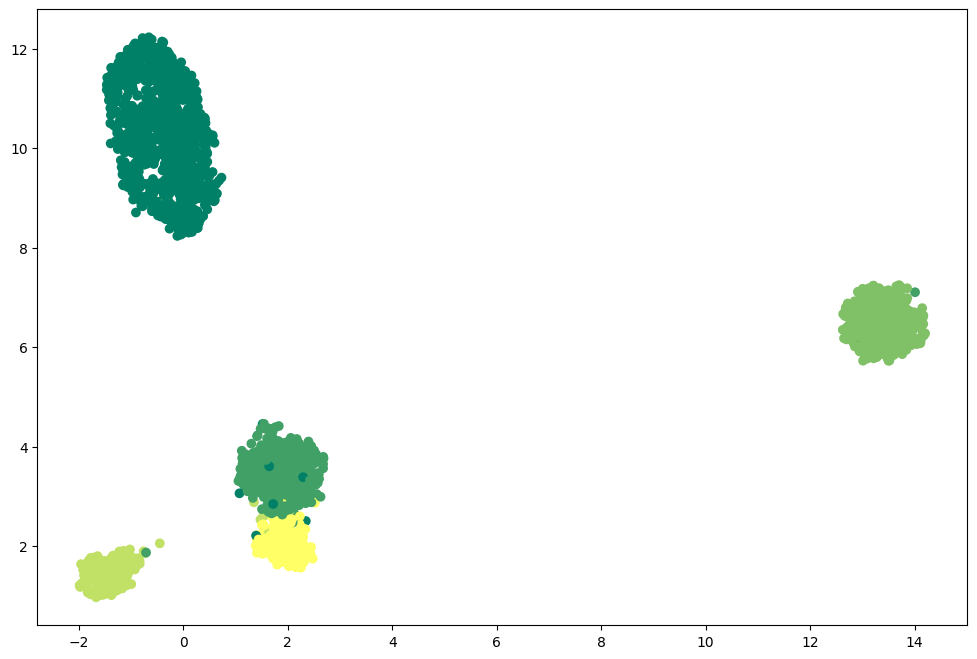

In [4461]:
fig = plt.figure(figsize=(12,8))
plt.scatter(X_umap['dim_1'],X_umap['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

# clustering algorithms

## k-means 

In [3999]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [4000]:
kmeans.fit(X_values)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [4464]:
df_kmeans = X_values.copy()

In [4467]:
df_kmeans['target'] = corr_dataset['target']

In [4468]:
df_kmeans['k_means'] = kmeans.labels_

In [4469]:
df_kmeans

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,k_means,target
0,-0.734351,-1.093966,-1.024909,0.060999,0.097327,0.837871,0.431663,0.100971,-0.557836,-0.035877,1.015477,-0.711252,0.491439,0.790845,-0.386329,0,1
1,2.038067,-0.670145,-0.032080,2.087925,-1.616391,-1.699436,0.899443,-0.471148,-0.034778,-0.678061,-0.034432,0.390352,0.258937,-0.364741,-0.529630,3,0
2,-0.543940,0.735830,0.204364,1.815214,-0.928169,-0.773174,0.417127,-0.770167,0.219410,0.240721,0.175988,0.326953,1.144518,0.232396,0.764979,3,0
3,-1.031042,-0.159283,-0.867176,0.494764,-0.647790,-0.324961,-0.685295,-0.148026,-1.194011,0.025273,2.032501,-0.408854,0.485487,-0.042108,-1.688999,0,1
4,0.377949,0.674125,0.642655,-1.860408,0.031992,-1.468014,-0.197200,-0.078171,-0.342911,1.466690,-1.828213,-0.336579,1.330277,0.733494,-1.068350,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.398658,1.097935,1.173561,0.846250,-0.191818,-0.196111,-2.121558,1.819514,0.354646,-1.380211,-0.968890,0.878936,1.951884,-1.122522,-1.297338,3,0
2496,0.426713,-0.637423,2.199120,-1.075776,-0.974532,-0.554611,0.046439,1.412868,-1.036260,0.065113,0.371283,-0.044347,-1.346648,0.313308,2.632609,1,4
2497,-1.325637,-0.385676,-0.610419,0.430050,0.502792,0.705362,-1.464511,-0.250392,0.698382,-1.144567,1.227159,-1.325796,-0.275793,-0.548115,-0.299763,0,1
2498,-0.924190,1.614779,1.424196,-1.884112,0.323782,-1.267578,-2.285060,1.429527,-1.498520,-1.447332,-2.536693,1.668679,1.519069,-0.288740,-1.251685,3,0


In [4470]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.2068
accuracy after: 0.9692


In [4471]:
df_kmeans

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,k_means,target
0,-0.734351,-1.093966,-1.024909,0.060999,0.097327,0.837871,0.431663,0.100971,-0.557836,-0.035877,1.015477,-0.711252,0.491439,0.790845,-0.386329,1,1
1,2.038067,-0.670145,-0.032080,2.087925,-1.616391,-1.699436,0.899443,-0.471148,-0.034778,-0.678061,-0.034432,0.390352,0.258937,-0.364741,-0.529630,0,0
2,-0.543940,0.735830,0.204364,1.815214,-0.928169,-0.773174,0.417127,-0.770167,0.219410,0.240721,0.175988,0.326953,1.144518,0.232396,0.764979,0,0
3,-1.031042,-0.159283,-0.867176,0.494764,-0.647790,-0.324961,-0.685295,-0.148026,-1.194011,0.025273,2.032501,-0.408854,0.485487,-0.042108,-1.688999,1,1
4,0.377949,0.674125,0.642655,-1.860408,0.031992,-1.468014,-0.197200,-0.078171,-0.342911,1.466690,-1.828213,-0.336579,1.330277,0.733494,-1.068350,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.398658,1.097935,1.173561,0.846250,-0.191818,-0.196111,-2.121558,1.819514,0.354646,-1.380211,-0.968890,0.878936,1.951884,-1.122522,-1.297338,0,0
2496,0.426713,-0.637423,2.199120,-1.075776,-0.974532,-0.554611,0.046439,1.412868,-1.036260,0.065113,0.371283,-0.044347,-1.346648,0.313308,2.632609,4,4
2497,-1.325637,-0.385676,-0.610419,0.430050,0.502792,0.705362,-1.464511,-0.250392,0.698382,-1.144567,1.227159,-1.325796,-0.275793,-0.548115,-0.299763,1,1
2498,-0.924190,1.614779,1.424196,-1.884112,0.323782,-1.267578,-2.285060,1.429527,-1.498520,-1.447332,-2.536693,1.668679,1.519069,-0.288740,-1.251685,0,0


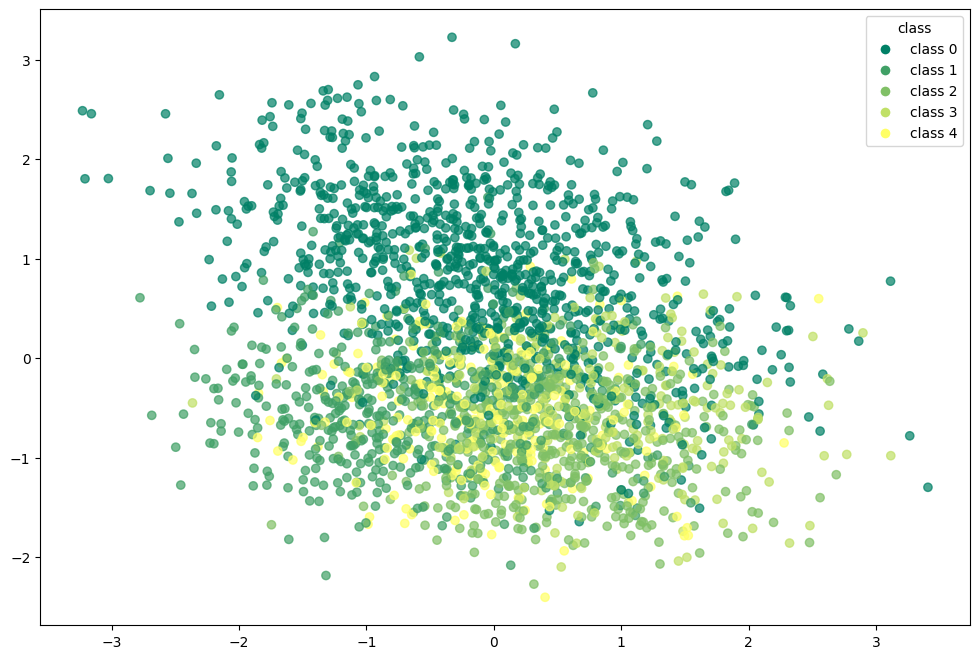

In [4472]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

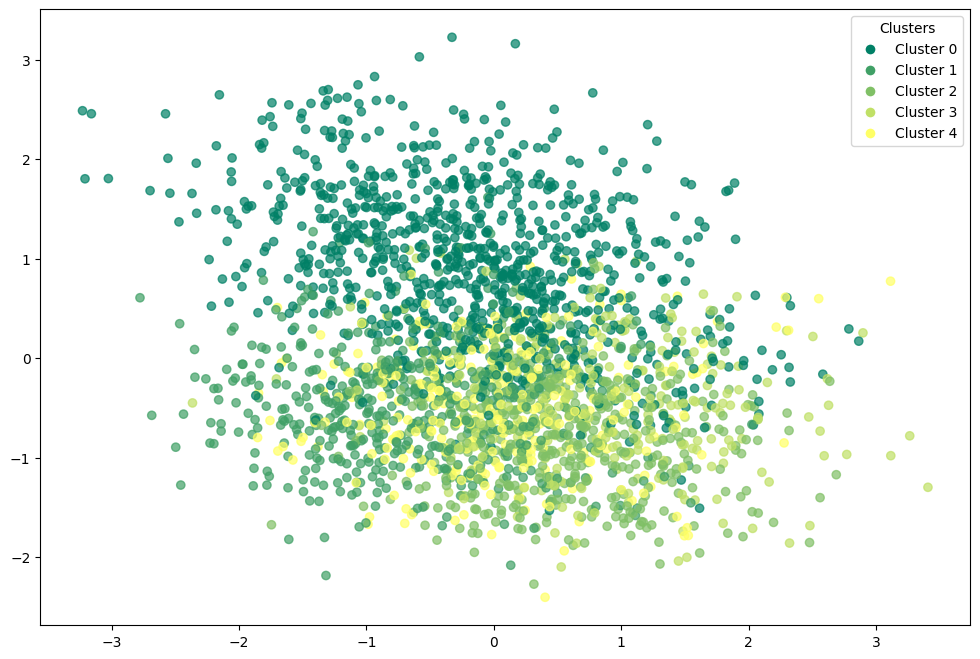

In [4473]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4474]:
kmeans.cluster_centers_

array([[-0.70153589, -0.48166048,  0.01396932, -0.46532847, -0.15659652,
         0.2915498 , -0.20531598, -0.67634608, -0.48189596, -0.45059041,
         0.90875517, -0.75105611,  0.17623768,  0.29061684, -0.54636971],
       [ 0.02698785, -0.52101023,  0.67029551, -0.64146092, -0.26637282,
         0.0053392 , -0.08292068,  0.35521354, -1.20906451,  0.94844737,
         0.74421949, -0.66929643, -0.91019478,  0.68555445,  1.26977451],
       [ 0.53487798, -0.77481892, -1.22555549,  0.93132952,  1.39622882,
         0.74545551,  0.25777844, -1.07093292,  0.33473601, -0.50251482,
        -0.50101407, -0.10601452, -0.91915155,  0.96973836,  0.0381417 ],
       [-0.1630469 ,  0.95617443,  0.48459046, -0.03432483, -0.44424178,
        -0.8018868 , -0.43949238,  0.62919436,  0.17225082,  0.22845813,
        -0.74015928,  0.92388905,  0.84754674, -0.61090889, -0.17642864],
       [ 0.83647431, -0.45484786, -0.13807325, -0.08322896, -0.48473335,
         0.86576372,  1.52000273,  0.67409038, 

In [4475]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[942   9   1  20  28]
 [  1 485   3   3   8]
 [  0   0 500   0   0]
 [  0   3   0 247   0]
 [  0   1   0   0 249]]


In [4476]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1000
           1       0.97      0.97      0.97       500
           2       0.99      1.00      1.00       500
           3       0.91      0.99      0.95       250
           4       0.87      1.00      0.93       250

    accuracy                           0.97      2500
   macro avg       0.95      0.98      0.96      2500
weighted avg       0.97      0.97      0.97      2500



In [4477]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.9253478066434491

In [4478]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.9043849335131411

In [4479]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.20481344072984434

### k-means with pca

In [4014]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [4015]:
kmeans_pca.fit(X_pca)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [4480]:
df_pca_kmeans = X_pca.copy()

In [4481]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [4484]:
df_pca_kmeans['target'] = corr_dataset['target']

In [4486]:
df_pca_kmeans

,dim_1,dim_2,dim_3,dim_4,kmeans_pca,target
0,-1.388603,0.465307,-1.143328,0.436212,0,1
1,-0.142474,-0.562371,2.396270,0.234201,2,0
2,0.687888,-0.425246,0.809689,-0.363627,2,0
3,-0.008288,0.578414,-1.665925,0.616777,0,1
4,1.986106,0.021519,-0.239403,-1.138866,4,0
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,4,0
2496,0.391958,3.015240,0.467748,-1.540382,3,4
2497,-0.966532,-0.242308,-1.591353,1.294384,0,1
2498,4.536698,-1.448120,-2.176720,-0.853220,4,0


In [4487]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.0036
accuracy after: 0.6972


In [4488]:
df_pca_kmeans

,dim_1,dim_2,dim_3,dim_4,kmeans_pca,target
0,-1.388603,0.465307,-1.143328,0.436212,1,1
1,-0.142474,-0.562371,2.396270,0.234201,0,0
2,0.687888,-0.425246,0.809689,-0.363627,0,0
3,-0.008288,0.578414,-1.665925,0.616777,1,1
4,1.986106,0.021519,-0.239403,-1.138866,3,0
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,3,0
2496,0.391958,3.015240,0.467748,-1.540382,4,4
2497,-0.966532,-0.242308,-1.591353,1.294384,1,1
2498,4.536698,-1.448120,-2.176720,-0.853220,3,0


In [4489]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[503   4   0 493   0]
 [  0 490   5   5   0]
 [  0   0 500   0   0]
 [  0 249   1   0   0]
 [  0   0   0   0 250]]


In [4490]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67      1000
           1       0.66      0.98      0.79       500
           2       0.99      1.00      0.99       500
           3       0.00      0.00      0.00       250
           4       1.00      1.00      1.00       250

    accuracy                           0.70      2500
   macro avg       0.73      0.70      0.69      2500
weighted avg       0.83      0.70      0.72      2500



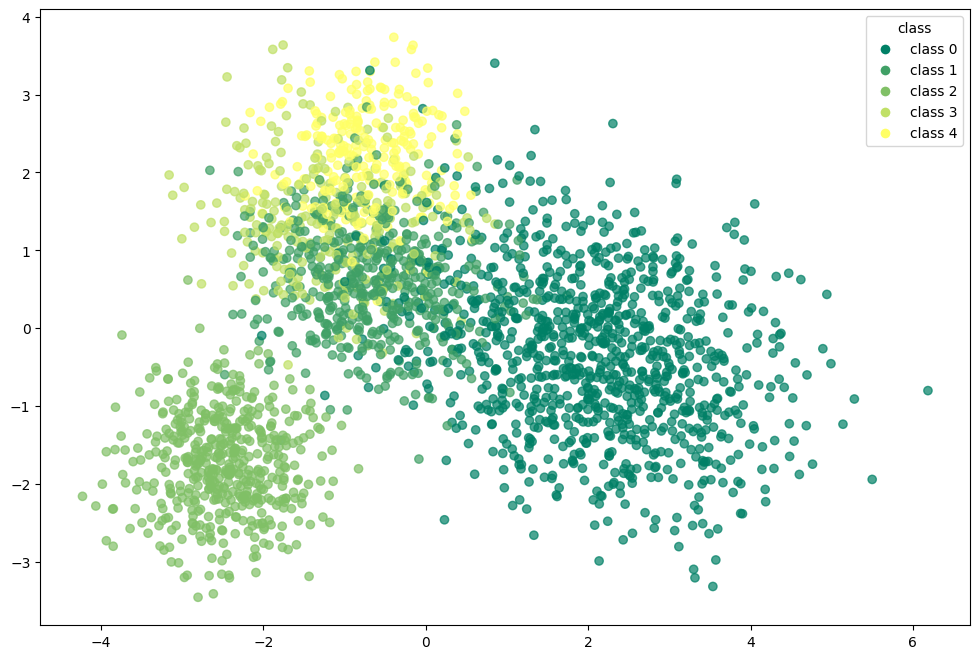

In [4491]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

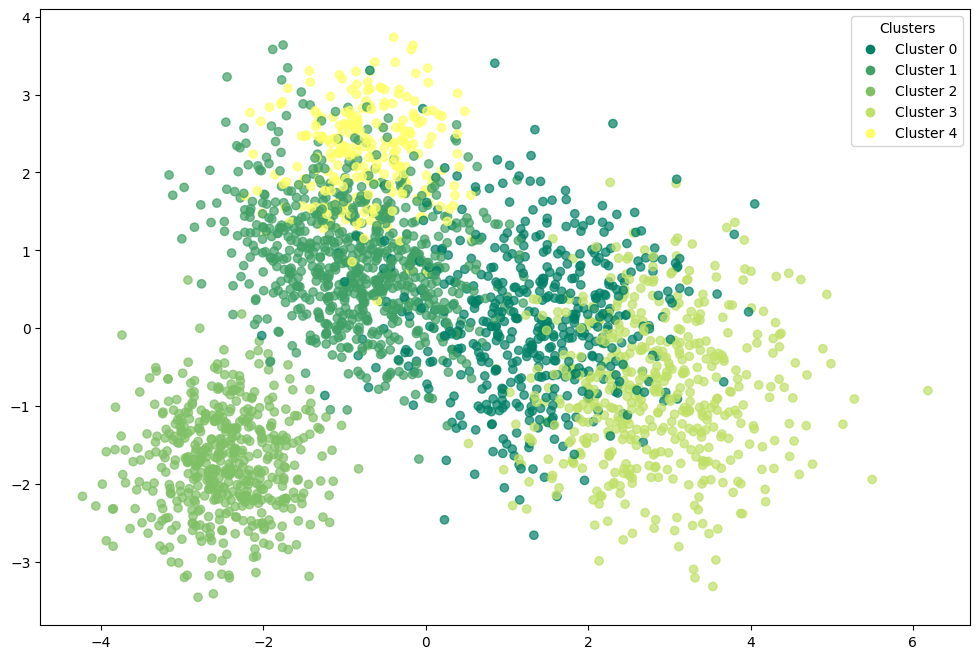

In [4492]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4493]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.6600949256825431

In [4494]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8231473741608868

In [4495]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.32881366713143956

### k-means with t-SNE

In [4028]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [4029]:
kmeans_tsne.fit(X_tsne)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [4496]:
df_tsne_kmeans = X_tsne.copy()

In [4497]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [4499]:
df_tsne_kmeans['target'] = corr_dataset['target']

In [4500]:
df_tsne_kmeans

,dim_1,dim_2,dim_3,kmeans_tsne,target
0,-15.979687,7.722937,-2.993647,0,1
1,4.885467,13.854942,3.726759,3,0
2,9.337600,10.560486,7.206385,3,0
3,-21.735916,4.469969,-2.808877,0,1
4,6.096224,-3.138047,-9.427560,1,0
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,1,0
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,0,1
2498,12.414795,-16.634073,2.181808,1,0


In [4501]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.4024
accuracy after: 0.9156


In [4502]:
df_tsne_kmeans

,dim_1,dim_2,dim_3,kmeans_tsne,target
0,-15.979687,7.722937,-2.993647,1,1
1,4.885467,13.854942,3.726759,3,0
2,9.337600,10.560486,7.206385,3,0
3,-21.735916,4.469969,-2.808877,1,1
4,6.096224,-3.138047,-9.427560,0,0
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,0
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,1,1
2498,12.414795,-16.634073,2.181808,0,0


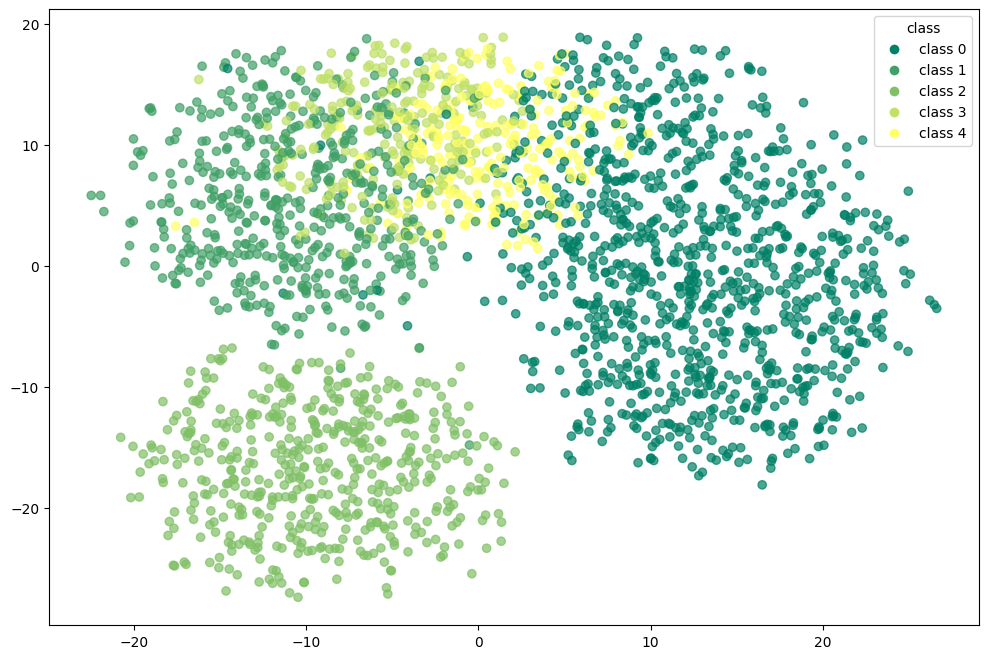

In [4503]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

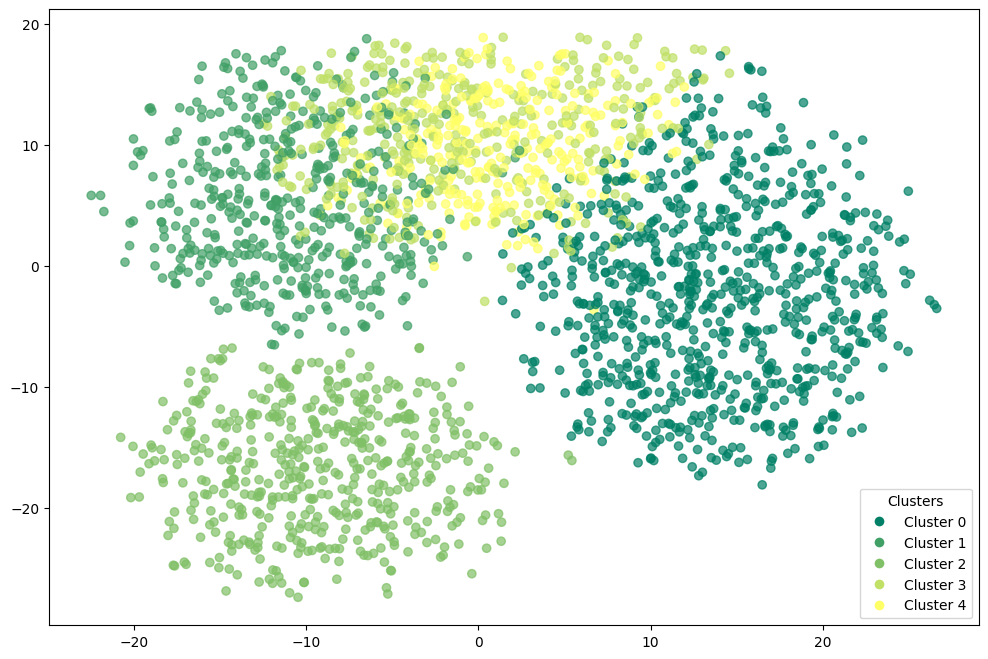

In [4504]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4505]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[821  11   2 135  31]
 [  0 473   3   7  17]
 [  0   0 499   1   0]
 [  0   1   0 248   1]
 [  0   2   0   0 248]]


In [4506]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.82      0.90      1000
           1       0.97      0.95      0.96       500
           2       0.99      1.00      0.99       500
           3       0.63      0.99      0.77       250
           4       0.84      0.99      0.91       250

    accuracy                           0.92      2500
   macro avg       0.89      0.95      0.91      2500
weighted avg       0.94      0.92      0.92      2500



In [4507]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.8030492455726115

In [4508]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.8243615490139519

In [4509]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.40351602435112

### k-means with umap

In [4042]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [4043]:
kmeans_umap.fit(X_umap)

,n_clusters,5
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [4044]:
df_umap_kmeans = X_umap.copy()

In [4045]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [4510]:
df_umap_kmeans['target'] = corr_dataset['target']

In [4511]:
df_umap_kmeans

,dim_1,dim_2,dim_3,target,kmeans_umap
0,1.388764,3.447327,4.915366,1,1
1,-0.225389,8.524396,5.733206,0,0
2,-0.600339,8.787193,5.004326,0,0
3,1.887043,3.825255,5.056378,1,1
4,0.174673,10.452823,5.602652,0,0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,0,0
2496,1.796548,1.624212,2.380335,4,4
2497,1.484902,3.208266,5.375015,1,1
2498,-0.758749,12.084641,4.810950,0,0


In [4512]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.9912
accuracy after: 0.9912


In [4513]:
df_umap_kmeans

,dim_1,dim_2,dim_3,target,kmeans_umap
0,1.388764,3.447327,4.915366,1,1
1,-0.225389,8.524396,5.733206,0,0
2,-0.600339,8.787193,5.004326,0,0
3,1.887043,3.825255,5.056378,1,1
4,0.174673,10.452823,5.602652,0,0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,0,0
2496,1.796548,1.624212,2.380335,4,4
2497,1.484902,3.208266,5.375015,1,1
2498,-0.758749,12.084641,4.810950,0,0


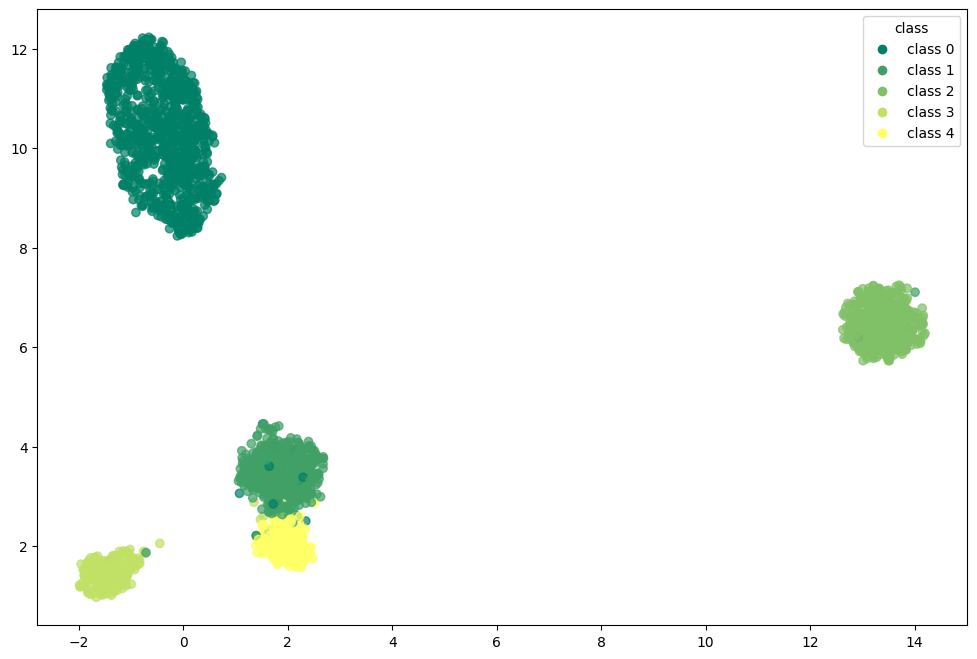

In [4514]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

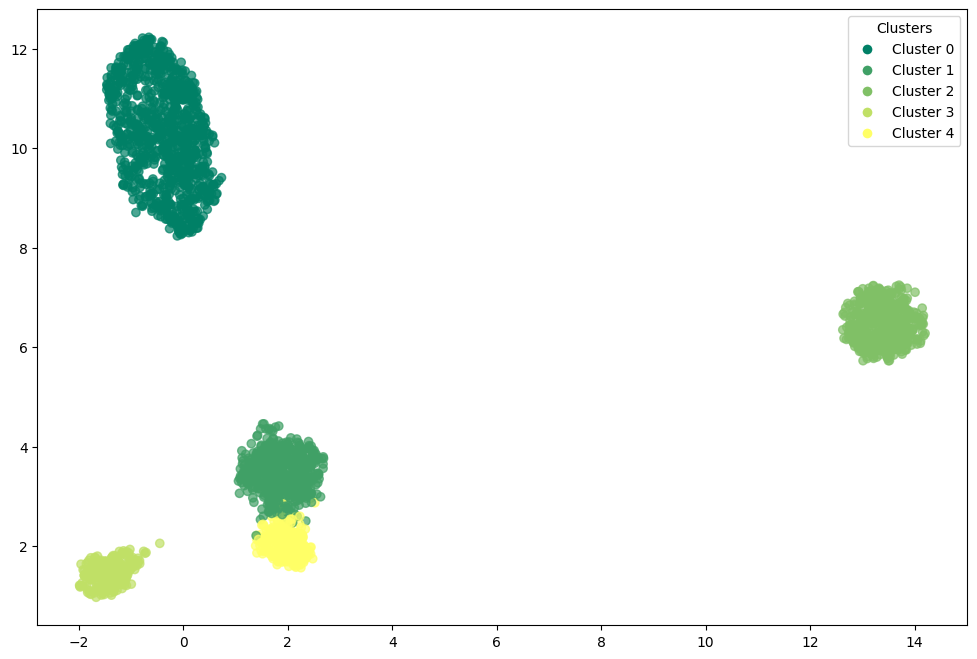

In [4515]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4516]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[988  12   0   0   0]
 [  0 495   3   2   0]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   0   0   0 250]]


In [4517]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.99      0.98       500
           2       0.99      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       1.00      1.00      1.00       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4518]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9778828506405981

In [4519]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9665904609431749

In [4520]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.7909843325614929

## Birch

In [4056]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [4057]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [4521]:
df_birch = X_values.copy()

In [4524]:
df_birch['birch'] = birch.labels_

In [4525]:
df_birch['target'] = corr_dataset['target']

In [4527]:
df_birch

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,birch,target
0,-0.734351,-1.093966,-1.024909,0.060999,0.097327,0.837871,0.431663,0.100971,-0.557836,-0.035877,1.015477,-0.711252,0.491439,0.790845,-0.386329,0,1
1,2.038067,-0.670145,-0.032080,2.087925,-1.616391,-1.699436,0.899443,-0.471148,-0.034778,-0.678061,-0.034432,0.390352,0.258937,-0.364741,-0.529630,1,0
2,-0.543940,0.735830,0.204364,1.815214,-0.928169,-0.773174,0.417127,-0.770167,0.219410,0.240721,0.175988,0.326953,1.144518,0.232396,0.764979,1,0
3,-1.031042,-0.159283,-0.867176,0.494764,-0.647790,-0.324961,-0.685295,-0.148026,-1.194011,0.025273,2.032501,-0.408854,0.485487,-0.042108,-1.688999,0,1
4,0.377949,0.674125,0.642655,-1.860408,0.031992,-1.468014,-0.197200,-0.078171,-0.342911,1.466690,-1.828213,-0.336579,1.330277,0.733494,-1.068350,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.398658,1.097935,1.173561,0.846250,-0.191818,-0.196111,-2.121558,1.819514,0.354646,-1.380211,-0.968890,0.878936,1.951884,-1.122522,-1.297338,3,0
2496,0.426713,-0.637423,2.199120,-1.075776,-0.974532,-0.554611,0.046439,1.412868,-1.036260,0.065113,0.371283,-0.044347,-1.346648,0.313308,2.632609,0,4
2497,-1.325637,-0.385676,-0.610419,0.430050,0.502792,0.705362,-1.464511,-0.250392,0.698382,-1.144567,1.227159,-1.325796,-0.275793,-0.548115,-0.299763,0,1
2498,-0.924190,1.614779,1.424196,-1.884112,0.323782,-1.267578,-2.285060,1.429527,-1.498520,-1.447332,-2.536693,1.668679,1.519069,-0.288740,-1.251685,3,0


In [4528]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.2076
accuracy after: 0.6952


In [4529]:
df_birch

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,birch,target
0,-0.734351,-1.093966,-1.024909,0.060999,0.097327,0.837871,0.431663,0.100971,-0.557836,-0.035877,1.015477,-0.711252,0.491439,0.790845,-0.386329,1,1
1,2.038067,-0.670145,-0.032080,2.087925,-1.616391,-1.699436,0.899443,-0.471148,-0.034778,-0.678061,-0.034432,0.390352,0.258937,-0.364741,-0.529630,4,0
2,-0.543940,0.735830,0.204364,1.815214,-0.928169,-0.773174,0.417127,-0.770167,0.219410,0.240721,0.175988,0.326953,1.144518,0.232396,0.764979,4,0
3,-1.031042,-0.159283,-0.867176,0.494764,-0.647790,-0.324961,-0.685295,-0.148026,-1.194011,0.025273,2.032501,-0.408854,0.485487,-0.042108,-1.688999,1,1
4,0.377949,0.674125,0.642655,-1.860408,0.031992,-1.468014,-0.197200,-0.078171,-0.342911,1.466690,-1.828213,-0.336579,1.330277,0.733494,-1.068350,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.398658,1.097935,1.173561,0.846250,-0.191818,-0.196111,-2.121558,1.819514,0.354646,-1.380211,-0.968890,0.878936,1.951884,-1.122522,-1.297338,0,0
2496,0.426713,-0.637423,2.199120,-1.075776,-0.974532,-0.554611,0.046439,1.412868,-1.036260,0.065113,0.371283,-0.044347,-1.346648,0.313308,2.632609,1,4
2497,-1.325637,-0.385676,-0.610419,0.430050,0.502792,0.705362,-1.464511,-0.250392,0.698382,-1.144567,1.227159,-1.325796,-0.275793,-0.548115,-0.299763,1,1
2498,-0.924190,1.614779,1.424196,-1.884112,0.323782,-1.267578,-2.285060,1.429527,-1.498520,-1.447332,-2.536693,1.668679,1.519069,-0.288740,-1.251685,0,0


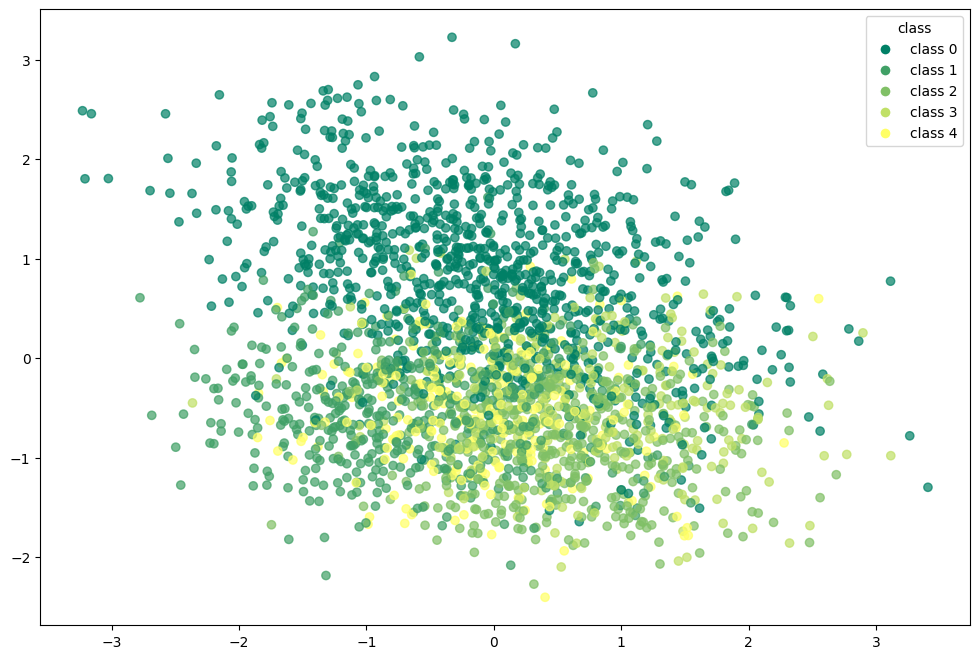

In [4530]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

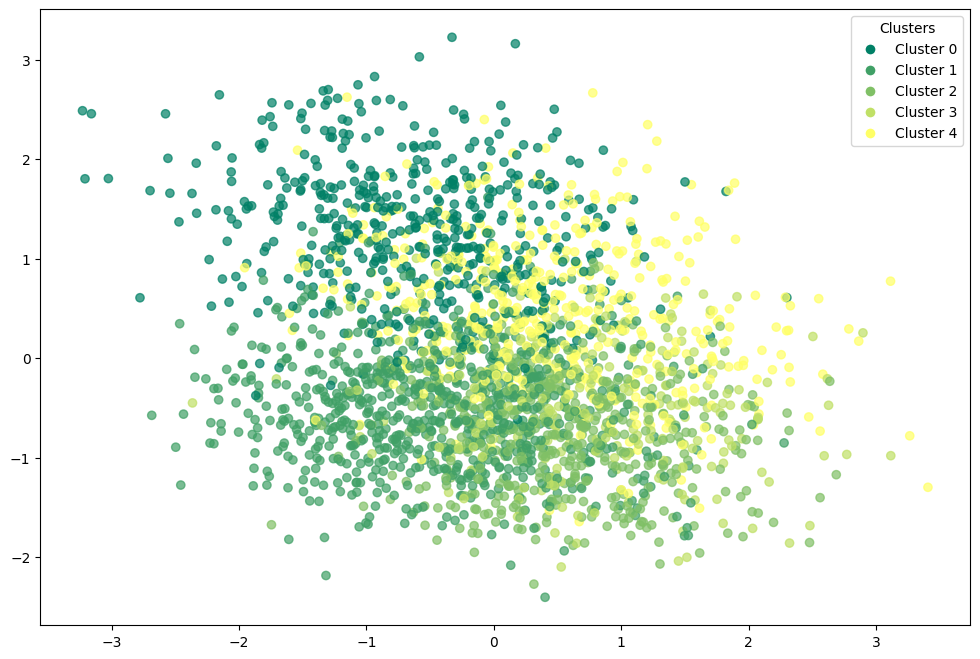

In [4531]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4532]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[507  16   0   1 476]
 [  5 491   0   3   1]
 [  0   0 499   0   1]
 [  2   8   0 240   0]
 [  0 248   0   1   1]]


In [4533]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.99      0.51      0.67      1000
           1       0.64      0.98      0.78       500
           2       1.00      1.00      1.00       500
           3       0.98      0.96      0.97       250
           4       0.00      0.00      0.00       250

    accuracy                           0.70      2500
   macro avg       0.72      0.69      0.68      2500
weighted avg       0.82      0.70      0.72      2500



In [4534]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.6399027872051963

In [4535]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.7914264290492249

In [4536]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.1910209369822148

### Birch with pca

In [4070]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [4071]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [4072]:
df_pca_birch = X_pca.copy()

In [4073]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [4537]:
df_pca_birch['target'] = corr_dataset['target']

In [4538]:
df_pca_birch

,dim_1,dim_2,dim_3,dim_4,target,birch_pca
0,-1.388603,0.465307,-1.143328,0.436212,1,2
1,-0.142474,-0.562371,2.396270,0.234201,0,1
2,0.687888,-0.425246,0.809689,-0.363627,0,1
3,-0.008288,0.578414,-1.665925,0.616777,1,2
4,1.986106,0.021519,-0.239403,-1.138866,0,0
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,0,0
2496,0.391958,3.015240,0.467748,-1.540382,4,4
2497,-0.966532,-0.242308,-1.591353,1.294384,1,2
2498,4.536698,-1.448120,-2.176720,-0.853220,0,0


In [4539]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.6584
accuracy after: 0.6584


In [4540]:
df_pca_birch

,dim_1,dim_2,dim_3,dim_4,target,birch_pca
0,-1.388603,0.465307,-1.143328,0.436212,1,2
1,-0.142474,-0.562371,2.396270,0.234201,0,1
2,0.687888,-0.425246,0.809689,-0.363627,0,1
3,-0.008288,0.578414,-1.665925,0.616777,1,2
4,1.986106,0.021519,-0.239403,-1.138866,0,0
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,0,0
2496,0.391958,3.015240,0.467748,-1.540382,4,4
2497,-0.966532,-0.242308,-1.591353,1.294384,1,2
2498,4.536698,-1.448120,-2.176720,-0.853220,0,0


In [4541]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[647 349   4   0   0]
 [  1   0 498   1   0]
 [  0   0 500   0   0]
 [  0   0   0 249   1]
 [  0   0   0   0 250]]


In [4542]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       1.00      0.65      0.79      1000
           1       0.00      0.00      0.00       500
           2       0.50      1.00      0.67       500
           3       1.00      1.00      1.00       250
           4       1.00      1.00      1.00       250

    accuracy                           0.66      2500
   macro avg       0.70      0.73      0.69      2500
weighted avg       0.70      0.66      0.65      2500



In [4543]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.5997713431963201

In [4544]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.8042522014035073

In [4545]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.2838322392441514

### Birch with t-SNE

In [4082]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [4083]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [4084]:
df_tsne_birch = X_tsne.copy()

In [4085]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [ ]:
df_tsne_birch['target'] = corr_dataset['target']

In [4086]:
df_tsne_birch

,dim_1,dim_2,dim_3,target,birch_tsne
0,-15.979687,7.722937,-2.993647,1,1
1,4.885467,13.854942,3.726759,0,0
2,9.337600,10.560486,7.206385,0,0
3,-21.735916,4.469969,-2.808877,1,1
4,6.096224,-3.138047,-9.427560,0,0
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,0
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,1,1
2498,12.414795,-16.634073,2.181808,0,0


In [4087]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.9836
accuracy after: 0.9836


In [4088]:
df_tsne_birch

,dim_1,dim_2,dim_3,target,birch_tsne
0,-15.979687,7.722937,-2.993647,1,1
1,4.885467,13.854942,3.726759,0,0
2,9.337600,10.560486,7.206385,0,0
3,-21.735916,4.469969,-2.808877,1,1
4,6.096224,-3.138047,-9.427560,0,0
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,0
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,1,1
2498,12.414795,-16.634073,2.181808,0,0


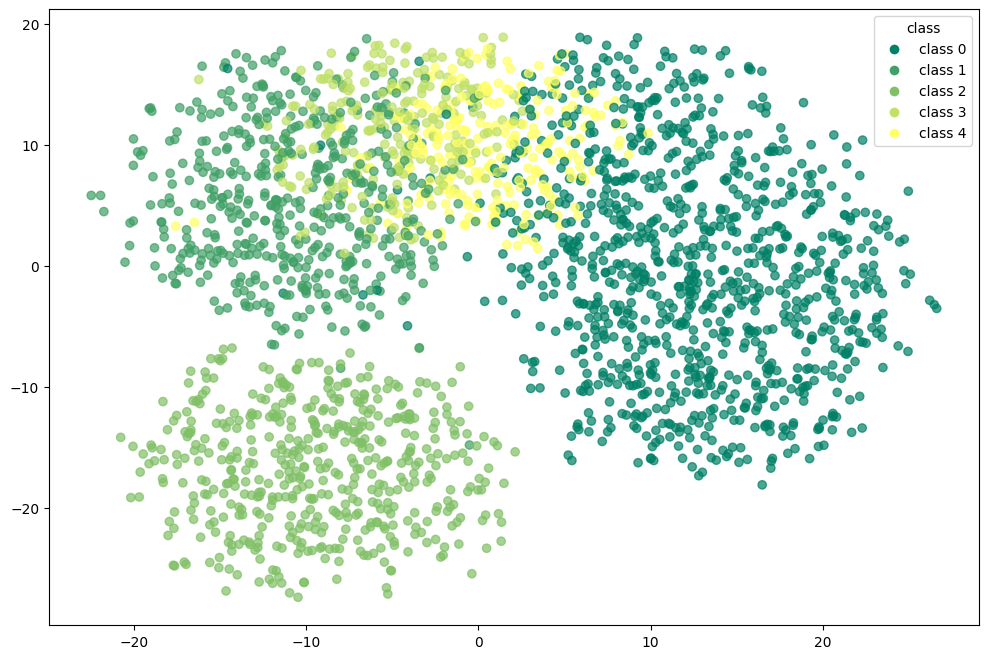

In [4089]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

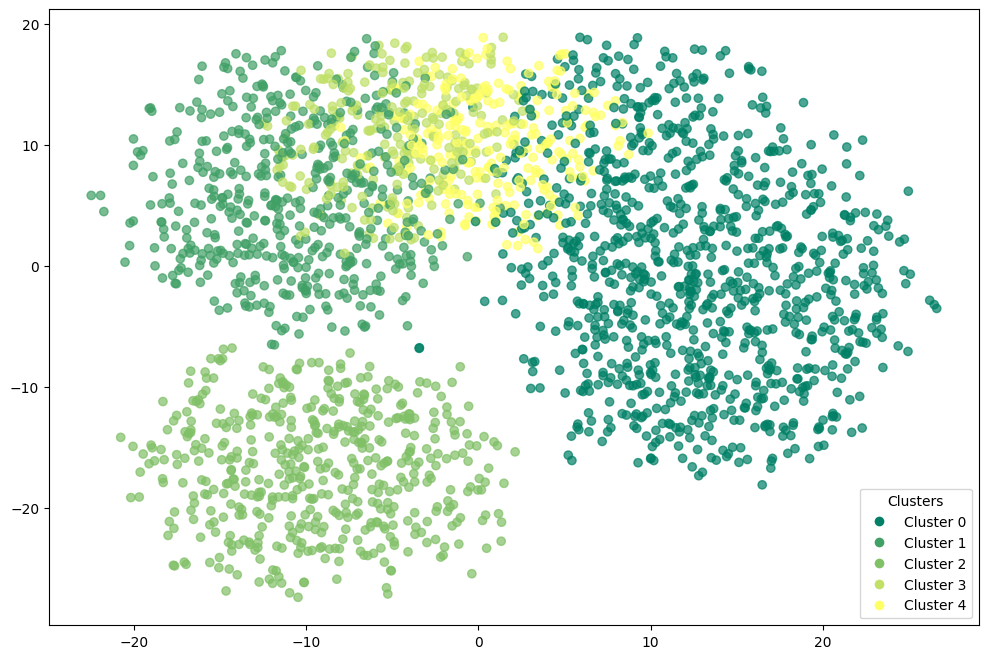

In [4090]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4091]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[985  13   0   0   2]
 [  2 490   2   2   4]
 [  2   0 498   0   0]
 [  0   8   0 241   1]
 [  0   5   0   0 245]]


In [4092]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1000
           1       0.95      0.98      0.96       500
           2       1.00      1.00      1.00       500
           3       0.99      0.96      0.98       250
           4       0.97      0.98      0.98       250

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [4093]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.963112639840623

In [4094]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.9391970610900249

In [4095]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.40579384565353394

### Birch with umap

In [4096]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [4097]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,5
,compute_labels,True
,copy,'deprecated'


In [4098]:
df_umap_birch = X_umap.copy()

In [4099]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [ ]:
df_umap_birch['target'] = corr_dataset['target']

In [4100]:
df_umap_birch

,dim_1,dim_2,dim_3,target,birch_umap
0,1.388764,3.447327,4.915366,1,4
1,-0.225389,8.524396,5.733206,0,2
2,-0.600339,8.787193,5.004326,0,2
3,1.887043,3.825255,5.056378,1,4
4,0.174673,10.452823,5.602652,0,2
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,0,2
2496,1.796548,1.624212,2.380335,4,0
2497,1.484902,3.208266,5.375015,1,4
2498,-0.758749,12.084641,4.810950,0,2


In [4101]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.1
accuracy after: 0.9912


In [4102]:
df_umap_birch

,dim_1,dim_2,dim_3,target,birch_umap
0,1.388764,3.447327,4.915366,1,1
1,-0.225389,8.524396,5.733206,0,0
2,-0.600339,8.787193,5.004326,0,0
3,1.887043,3.825255,5.056378,1,1
4,0.174673,10.452823,5.602652,0,0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,0,0
2496,1.796548,1.624212,2.380335,4,4
2497,1.484902,3.208266,5.375015,1,1
2498,-0.758749,12.084641,4.810950,0,0


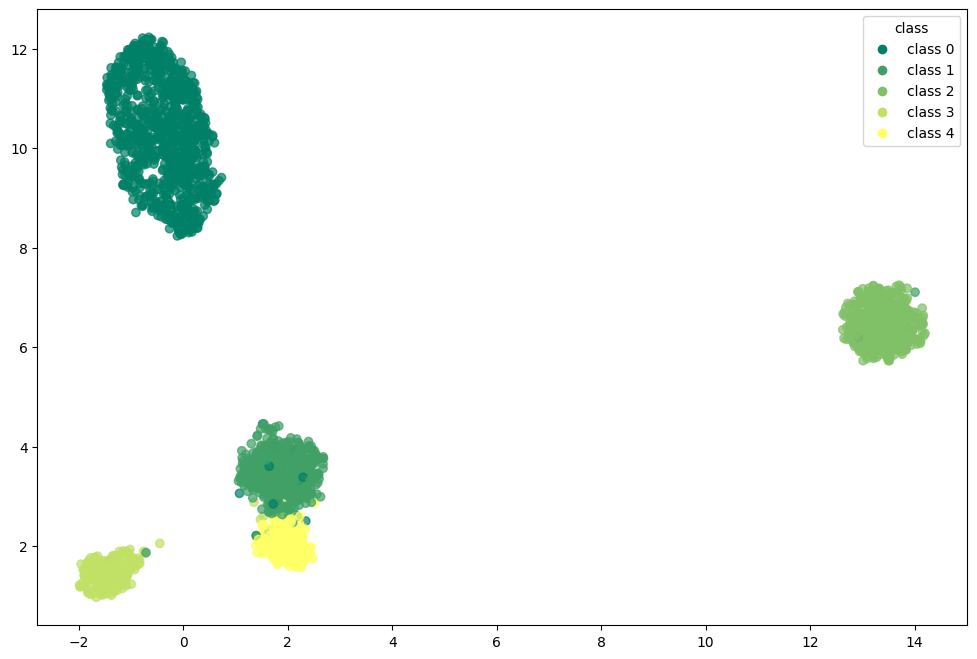

In [4103]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

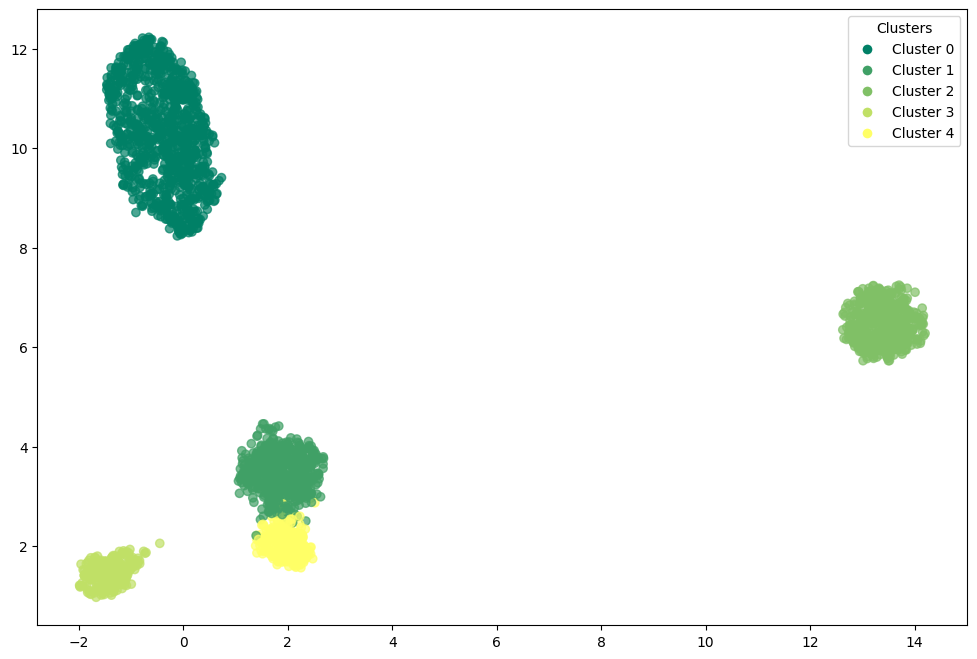

In [4104]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4105]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[988  12   0   0   0]
 [  0 495   3   2   0]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   0   0   0 250]]


In [4106]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.99      0.98       500
           2       0.99      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       1.00      1.00      1.00       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4107]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9778828506405981

In [4108]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9665904609431749

In [4109]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.7909843325614929

## GMM - Gaussian Mixture Models

In [4110]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [4111]:
gmm.fit(X_values)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_gmm = X_values.copy()

In [4113]:
df_gmm['gmm'] = gmm.predict(X_values)

In [4546]:
df_gmm['target'] = corr_dataset['target']

In [4547]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,gmm
0,-6.641994,-9.479383,-7.434598,2.492461,-1.865350,7.075877,-2.966371,2.807489,-2.888920,2.098265,6.950932,-5.735315,3.753097,6.279267,-8.062613,1,1
1,12.502562,-5.620948,0.700777,17.218309,-16.709952,-14.189903,0.375504,-2.501210,0.934144,-2.360506,-3.200338,4.642565,1.568382,-3.604043,-9.088398,0,0
2,-5.327140,7.178955,2.638236,15.237030,-10.748420,-6.426675,-3.070219,-5.275808,2.792020,4.018719,-1.165848,4.045300,9.889787,1.503058,0.178747,0,0
3,-8.690757,-0.970090,-6.142113,5.643818,-8.319720,-2.670098,-10.946052,0.497044,-7.538764,2.522839,16.784253,-2.886515,3.697169,-0.844674,-17.387462,1,1
4,1.038843,6.617195,6.229649,-11.466775,-2.431297,-12.250299,-7.459043,1.145227,-1.318021,12.530790,-20.543895,-2.205635,11.635283,5.788768,-12.944699,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-4.323914,10.475535,10.579961,8.197395,-4.369989,-1.590170,-21.206878,18.753874,3.780466,-7.235630,-12.235339,9.245371,17.476246,-10.085070,-14.583853,0,0
2496,1.375572,-5.323044,18.983532,-5.766337,-11.150029,-4.594845,-5.718455,14.980603,-6.385750,2.799453,0.722406,0.547390,-13.518577,2.195069,13.547726,4,4
2497,-10.725040,-3.031160,-4.038208,5.173658,1.646877,5.965287,-16.512855,-0.452808,6.292858,-5.599518,8.997633,-11.524752,-3.456236,-5.172379,-7.442953,1,1
2498,-7.952903,15.180848,12.633699,-11.638983,0.096250,-10.570395,-22.374953,15.135183,-9.764437,-7.701657,-27.393980,16.685303,13.409274,-2.954037,-14.257059,0,0


In [4115]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.2428
accuracy after: 0.9516


In [4116]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,gmm
0,-6.641994,-9.479383,-7.434598,2.492461,-1.865350,7.075877,-2.966371,2.807489,-2.888920,2.098265,6.950932,-5.735315,3.753097,6.279267,-8.062613,1,1
1,12.502562,-5.620948,0.700777,17.218309,-16.709952,-14.189903,0.375504,-2.501210,0.934144,-2.360506,-3.200338,4.642565,1.568382,-3.604043,-9.088398,0,0
2,-5.327140,7.178955,2.638236,15.237030,-10.748420,-6.426675,-3.070219,-5.275808,2.792020,4.018719,-1.165848,4.045300,9.889787,1.503058,0.178747,0,0
3,-8.690757,-0.970090,-6.142113,5.643818,-8.319720,-2.670098,-10.946052,0.497044,-7.538764,2.522839,16.784253,-2.886515,3.697169,-0.844674,-17.387462,1,1
4,1.038843,6.617195,6.229649,-11.466775,-2.431297,-12.250299,-7.459043,1.145227,-1.318021,12.530790,-20.543895,-2.205635,11.635283,5.788768,-12.944699,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-4.323914,10.475535,10.579961,8.197395,-4.369989,-1.590170,-21.206878,18.753874,3.780466,-7.235630,-12.235339,9.245371,17.476246,-10.085070,-14.583853,0,0
2496,1.375572,-5.323044,18.983532,-5.766337,-11.150029,-4.594845,-5.718455,14.980603,-6.385750,2.799453,0.722406,0.547390,-13.518577,2.195069,13.547726,4,4
2497,-10.725040,-3.031160,-4.038208,5.173658,1.646877,5.965287,-16.512855,-0.452808,6.292858,-5.599518,8.997633,-11.524752,-3.456236,-5.172379,-7.442953,1,1
2498,-7.952903,15.180848,12.633699,-11.638983,0.096250,-10.570395,-22.374953,15.135183,-9.764437,-7.701657,-27.393980,16.685303,13.409274,-2.954037,-14.257059,0,0


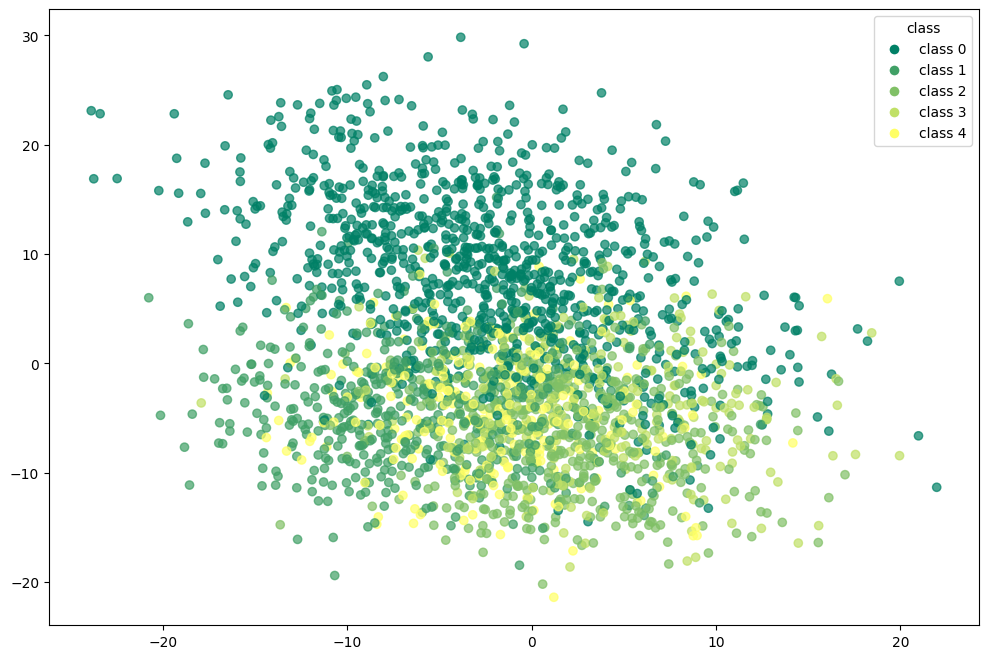

In [4117]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

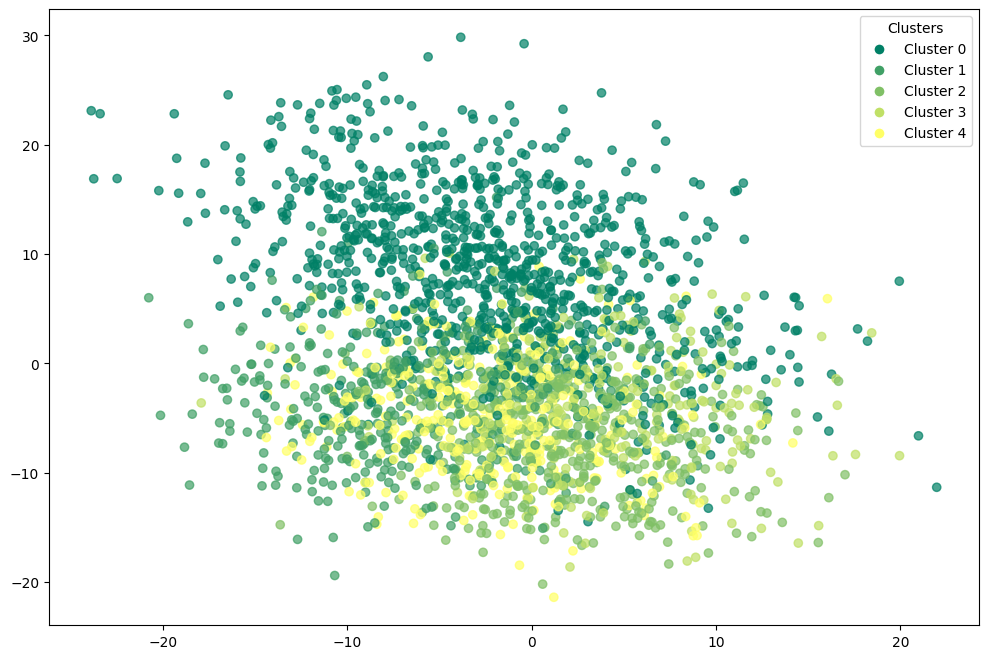

In [4118]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4119]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[997   1   0   1   1]
 [  4 389   2   1 104]
 [  1   0 499   0   0]
 [  3   0   0 245   2]
 [  0   1   0   0 249]]


In [4120]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1000
           1       0.99      0.78      0.87       500
           2       1.00      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       0.70      1.00      0.82       250

    accuracy                           0.95      2500
   macro avg       0.93      0.95      0.93      2500
weighted avg       0.96      0.95      0.95      2500



In [4121]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.9279694202739336

In [4122]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.9065545742653525

In [4123]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.20475704755693502

### GMM with pca

In [4124]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [4125]:
gmm_pca.fit(X_pca)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [4126]:
df_pca_gmm = X_pca.copy()

In [4127]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [ ]:
df_pca_gmm['target'] = corr_dataset['target']

In [4128]:
df_pca_gmm

,dim_1,dim_2,dim_3,dim_4,target,gmm_pca
0,-1.388603,0.465307,-1.143328,0.436212,1,0
1,-0.142474,-0.562371,2.396270,0.234201,0,2
2,0.687888,-0.425246,0.809689,-0.363627,0,2
3,-0.008288,0.578414,-1.665925,0.616777,1,0
4,1.986106,0.021519,-0.239403,-1.138866,0,2
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,0,4
2496,0.391958,3.015240,0.467748,-1.540382,4,3
2497,-0.966532,-0.242308,-1.591353,1.294384,1,0
2498,4.536698,-1.448120,-2.176720,-0.853220,0,4


In [4129]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.7088


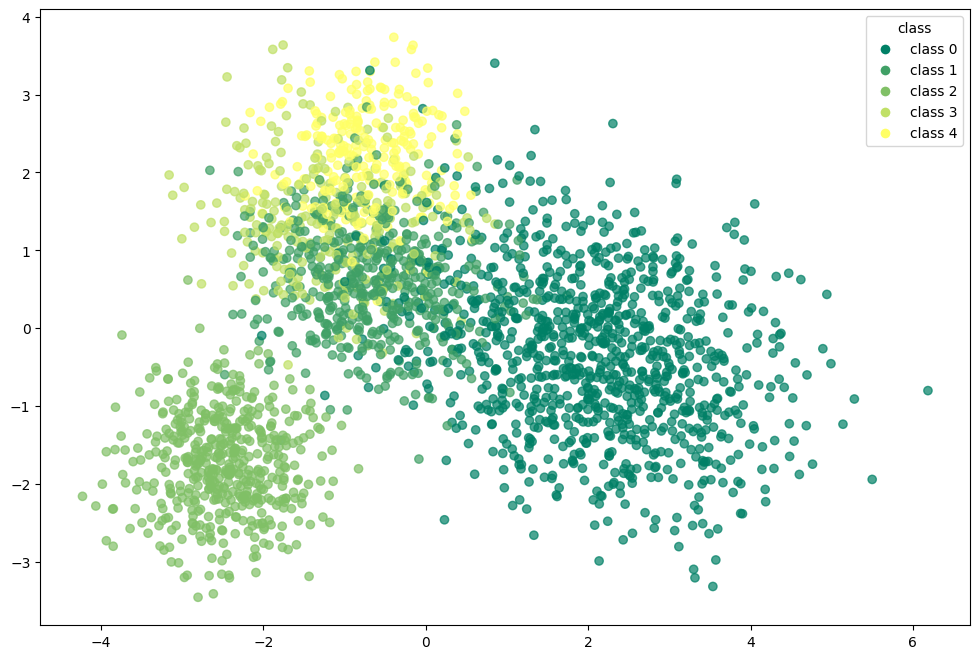

In [4130]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

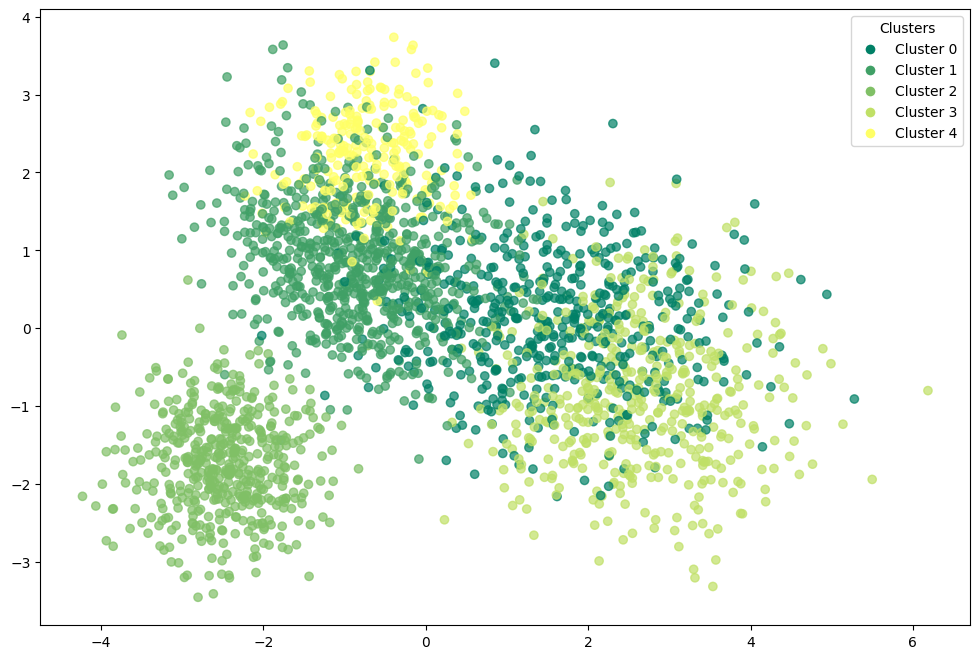

In [4131]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4132]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[522   0   0 478   0]
 [  0 500   0   0   0]
 [  0   0 500   0   0]
 [  0 250   0   0   0]
 [  0   0   0   0 250]]


In [4133]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.52      0.69      1000
           1       0.67      1.00      0.80       500
           2       1.00      1.00      1.00       500
           3       0.00      0.00      0.00       250
           4       1.00      1.00      1.00       250

    accuracy                           0.71      2500
   macro avg       0.73      0.70      0.70      2500
weighted avg       0.83      0.71      0.73      2500



In [4134]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.671848243158276

In [4135]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.8454762988131223

In [4136]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.31025656459310413

### GMM with t-SNE

In [4137]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [4138]:
gmm_tsne.fit(X_tsne)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [4139]:
df_tsne_gmm = X_tsne.copy()

In [4140]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [ ]:
df_tsne_gmm['target'] = corr_dataset['target']

In [4141]:
df_tsne_gmm

,dim_1,dim_2,dim_3,target,gmm_tsne
0,-15.979687,7.722937,-2.993647,1,0
1,4.885467,13.854942,3.726759,0,1
2,9.337600,10.560486,7.206385,0,1
3,-21.735916,4.469969,-2.808877,1,0
4,6.096224,-3.138047,-9.427560,0,1
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,1
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,1,0
2498,12.414795,-16.634073,2.181808,0,1


In [4142]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.4
accuracy after: 1.0


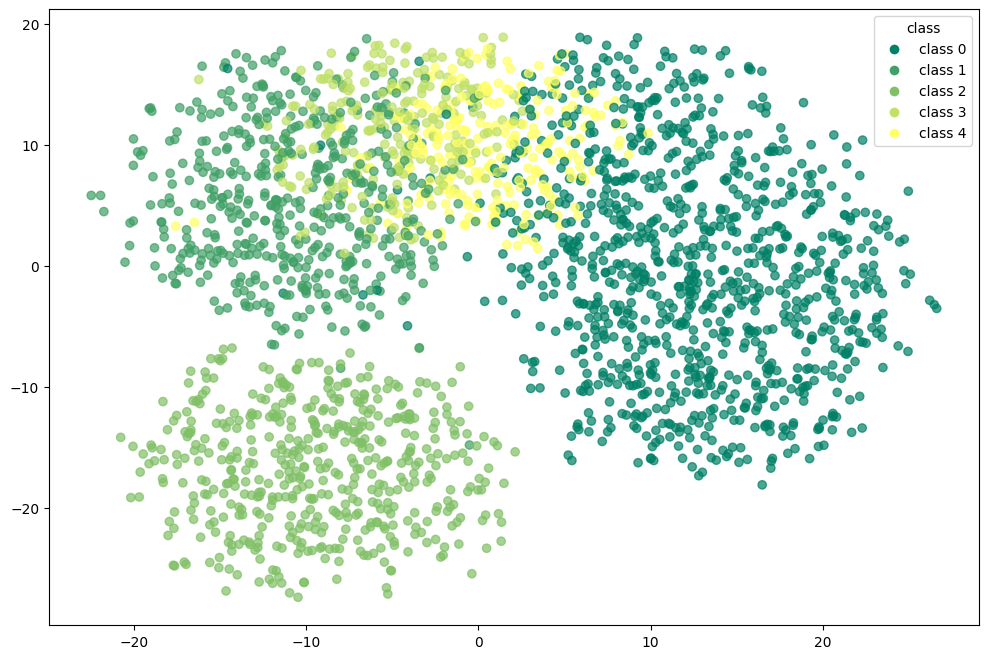

In [4143]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

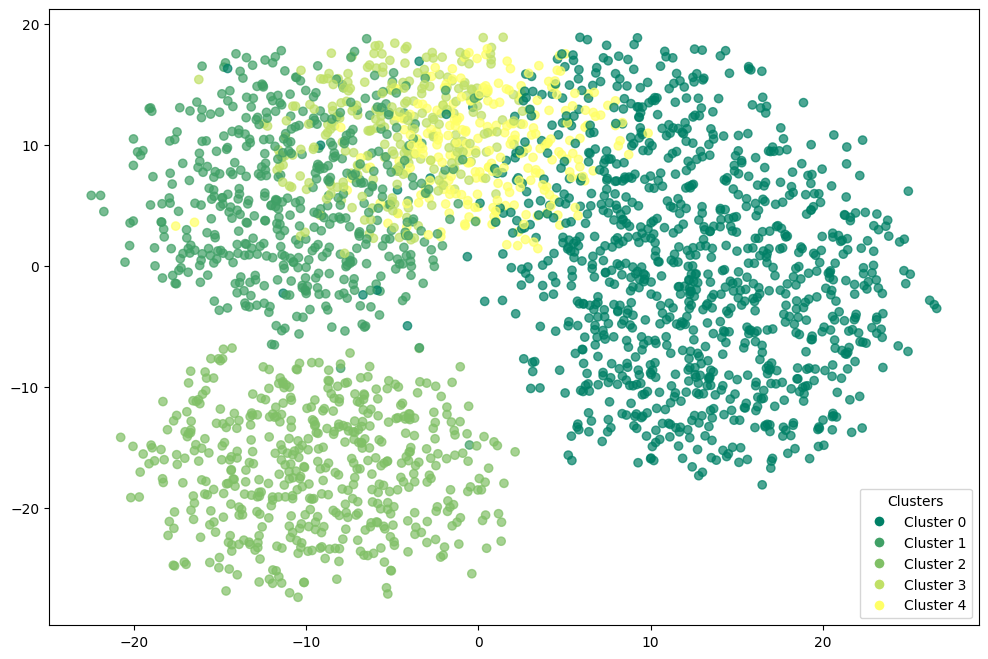

In [4144]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4145]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1000    0    0    0    0]
 [   0  500    0    0    0]
 [   0    0  500    0    0]
 [   0    0    0  250    0]
 [   0    0    0    0  250]]


In [4146]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00       500
           2       1.00      1.00      1.00       500
           3       1.00      1.00      1.00       250
           4       1.00      1.00      1.00       250

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [4147]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

1.0

In [4148]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

1.0

In [4149]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.4001714289188385

### GMM with umap

In [4555]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [4556]:
gmm_umap.fit(X_umap)

,n_components,5
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [4557]:
df_umap_gmm = X_umap.copy()

In [4558]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [4559]:
df_umap_gmm['target'] = corr_dataset['target']

In [4560]:
df_umap_gmm

,dim_1,dim_2,dim_3,gmm_umap,target
0,1.388764,3.447327,4.915366,0,1
1,-0.225389,8.524396,5.733206,2,0
2,-0.600339,8.787193,5.004326,2,0
3,1.887043,3.825255,5.056378,0,1
4,0.174673,10.452823,5.602652,2,0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,2,0
2496,1.796548,1.624212,2.380335,4,4
2497,1.484902,3.208266,5.375015,0,1
2498,-0.758749,12.084641,4.810950,2,0


In [4561]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.2024
accuracy after: 0.9872


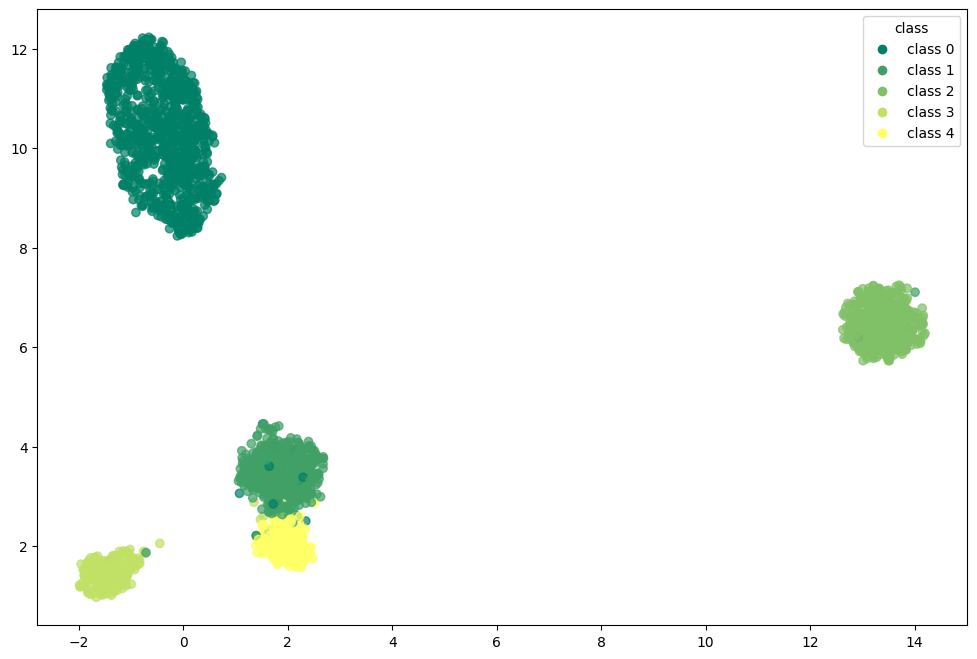

In [4562]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

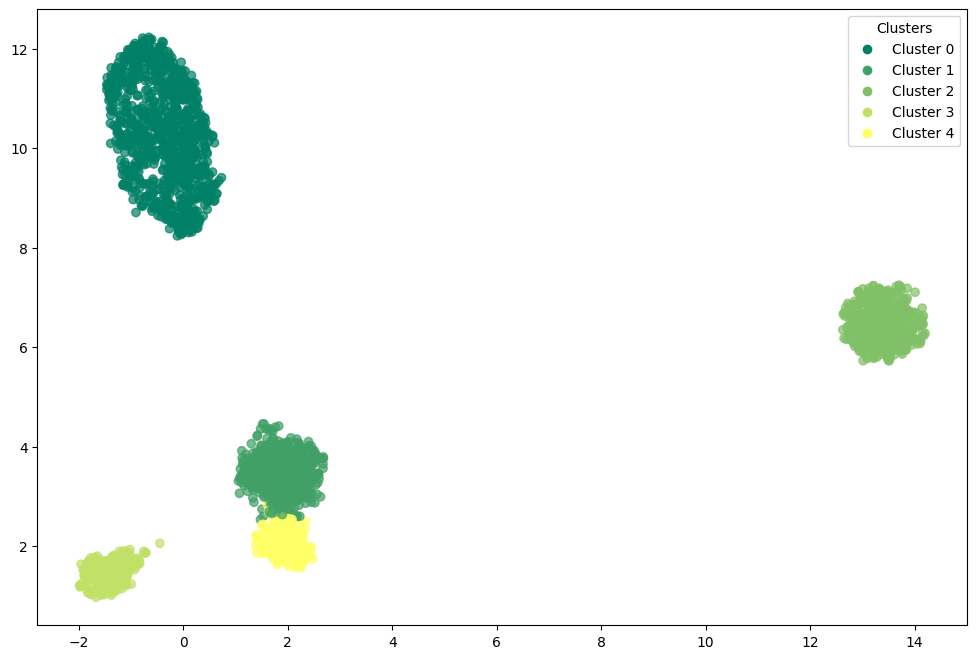

In [4563]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4564]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[988  10   0   0   2]
 [  0 489   3   2   6]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   4   0   0 246]]


In [4565]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.98      0.97       500
           2       0.99      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       0.96      0.98      0.97       250

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.98      2500
weighted avg       0.99      0.99      0.99      2500



In [4566]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9721517539495163

In [4567]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9511320386408226

In [4568]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.797446072101593

## pam

In [4163]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [4164]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam = kmedoids(X_values.values.tolist(),initial_medoids,metric=metric)

In [4166]:
pam.process()

In [4167]:
clusters = pam.get_clusters()

In [4168]:
medoids = pam.get_medoids()

In [4169]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4170]:
df_pam = corr_dataset.copy()

In [4171]:
df_pam['pam'] = labels

In [ ]:
df_pam['target'] = corr_dataset['target']

In [4172]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-6.641994,-9.479383,-7.434598,2.492461,-1.865350,7.075877,-2.966371,2.807489,-2.888920,2.098265,6.950932,-5.735315,3.753097,6.279267,-8.062613,1,1.0
1,12.502562,-5.620948,0.700777,17.218309,-16.709952,-14.189903,0.375504,-2.501210,0.934144,-2.360506,-3.200338,4.642565,1.568382,-3.604043,-9.088398,0,4.0
2,-5.327140,7.178955,2.638236,15.237030,-10.748420,-6.426675,-3.070219,-5.275808,2.792020,4.018719,-1.165848,4.045300,9.889787,1.503058,0.178747,0,4.0
3,-8.690757,-0.970090,-6.142113,5.643818,-8.319720,-2.670098,-10.946052,0.497044,-7.538764,2.522839,16.784253,-2.886515,3.697169,-0.844674,-17.387462,1,1.0
4,1.038843,6.617195,6.229649,-11.466775,-2.431297,-12.250299,-7.459043,1.145227,-1.318021,12.530790,-20.543895,-2.205635,11.635283,5.788768,-12.944699,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-4.323914,10.475535,10.579961,8.197395,-4.369989,-1.590170,-21.206878,18.753874,3.780466,-7.235630,-12.235339,9.245371,17.476246,-10.085070,-14.583853,0,3.0
2496,1.375572,-5.323044,18.983532,-5.766337,-11.150029,-4.594845,-5.718455,14.980603,-6.385750,2.799453,0.722406,0.547390,-13.518577,2.195069,13.547726,4,4.0
2497,-10.725040,-3.031160,-4.038208,5.173658,1.646877,5.965287,-16.512855,-0.452808,6.292858,-5.599518,8.997633,-11.524752,-3.456236,-5.172379,-7.442953,1,1.0
2498,-7.952903,15.180848,12.633699,-11.638983,0.096250,-10.570395,-22.374953,15.135183,-9.764437,-7.701657,-27.393980,16.685303,13.409274,-2.954037,-14.257059,0,3.0


In [4173]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.2128
accuracy after: 0.7184


In [4174]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-6.641994,-9.479383,-7.434598,2.492461,-1.865350,7.075877,-2.966371,2.807489,-2.888920,2.098265,6.950932,-5.735315,3.753097,6.279267,-8.062613,1,1
1,12.502562,-5.620948,0.700777,17.218309,-16.709952,-14.189903,0.375504,-2.501210,0.934144,-2.360506,-3.200338,4.642565,1.568382,-3.604043,-9.088398,0,0
2,-5.327140,7.178955,2.638236,15.237030,-10.748420,-6.426675,-3.070219,-5.275808,2.792020,4.018719,-1.165848,4.045300,9.889787,1.503058,0.178747,0,0
3,-8.690757,-0.970090,-6.142113,5.643818,-8.319720,-2.670098,-10.946052,0.497044,-7.538764,2.522839,16.784253,-2.886515,3.697169,-0.844674,-17.387462,1,1
4,1.038843,6.617195,6.229649,-11.466775,-2.431297,-12.250299,-7.459043,1.145227,-1.318021,12.530790,-20.543895,-2.205635,11.635283,5.788768,-12.944699,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-4.323914,10.475535,10.579961,8.197395,-4.369989,-1.590170,-21.206878,18.753874,3.780466,-7.235630,-12.235339,9.245371,17.476246,-10.085070,-14.583853,0,4
2496,1.375572,-5.323044,18.983532,-5.766337,-11.150029,-4.594845,-5.718455,14.980603,-6.385750,2.799453,0.722406,0.547390,-13.518577,2.195069,13.547726,4,0
2497,-10.725040,-3.031160,-4.038208,5.173658,1.646877,5.965287,-16.512855,-0.452808,6.292858,-5.599518,8.997633,-11.524752,-3.456236,-5.172379,-7.442953,1,1
2498,-7.952903,15.180848,12.633699,-11.638983,0.096250,-10.570395,-22.374953,15.135183,-9.764437,-7.701657,-27.393980,16.685303,13.409274,-2.954037,-14.257059,0,4


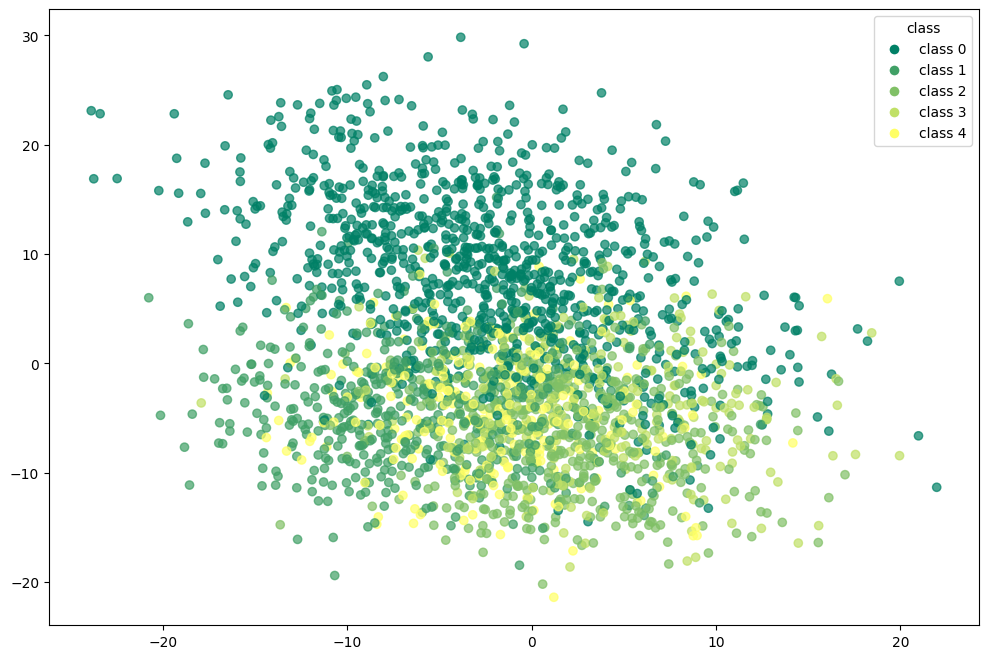

In [4175]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

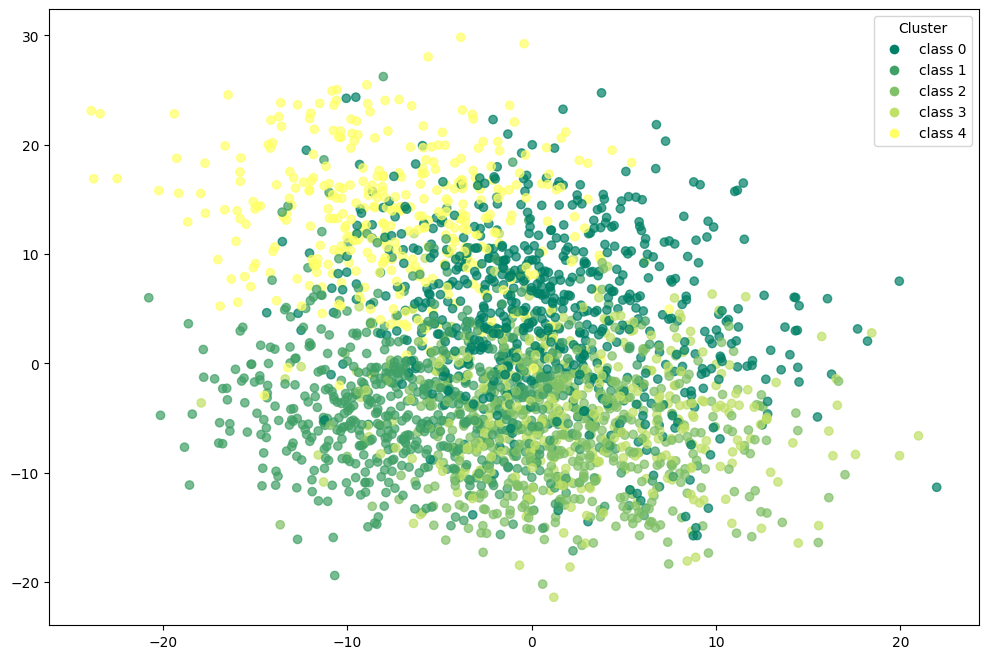

In [4176]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4177]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[579  35   0  13 373]
 [  1 470   3  26   0]
 [  1   0 499   0   0]
 [  1   1   0 248   0]
 [ 62 140   1  47   0]]


In [4178]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.90      0.58      0.70      1000
           1       0.73      0.94      0.82       500
           2       0.99      1.00      1.00       500
           3       0.74      0.99      0.85       250
           4       0.00      0.00      0.00       250

    accuracy                           0.72      2500
   macro avg       0.67      0.70      0.67      2500
weighted avg       0.78      0.72      0.73      2500



In [4179]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.605115247042397

In [4180]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.7036919849727938

In [4181]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.1769979428534072

### pam with pca

In [4182]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [4183]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4184]:
pam_pca = kmedoids(X_pca.values.tolist(),initial_medoids,metric=metric)

In [4185]:
pam_pca.process()

In [4186]:
clusters = pam_pca.get_clusters()

In [4187]:
medoids = pam_pca.get_medoids()

In [4188]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4189]:
df_pam_pca = X_pca.copy()

In [4190]:
df_pam_pca['pam_pca'] = labels

In [4191]:
df_pam_pca

,dim_1,dim_2,dim_3,dim_4,target,pam_pca
0,-1.388603,0.465307,-1.143328,0.436212,1,1.0
1,-0.142474,-0.562371,2.396270,0.234201,0,3.0
2,0.687888,-0.425246,0.809689,-0.363627,0,3.0
3,-0.008288,0.578414,-1.665925,0.616777,1,1.0
4,1.986106,0.021519,-0.239403,-1.138866,0,2.0
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,0,2.0
2496,0.391958,3.015240,0.467748,-1.540382,4,0.0
2497,-0.966532,-0.242308,-1.591353,1.294384,1,1.0
2498,4.536698,-1.448120,-2.176720,-0.853220,0,2.0


In [4192]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.1984
accuracy after: 0.7048


In [4193]:
df_pam_pca

,dim_1,dim_2,dim_3,dim_4,target,pam_pca
0,-1.388603,0.465307,-1.143328,0.436212,1,1
1,-0.142474,-0.562371,2.396270,0.234201,0,0
2,0.687888,-0.425246,0.809689,-0.363627,0,0
3,-0.008288,0.578414,-1.665925,0.616777,1,1
4,1.986106,0.021519,-0.239403,-1.138866,0,3
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,0,3
2496,0.391958,3.015240,0.467748,-1.540382,4,4
2497,-0.966532,-0.242308,-1.591353,1.294384,1,1
2498,4.536698,-1.448120,-2.176720,-0.853220,0,3


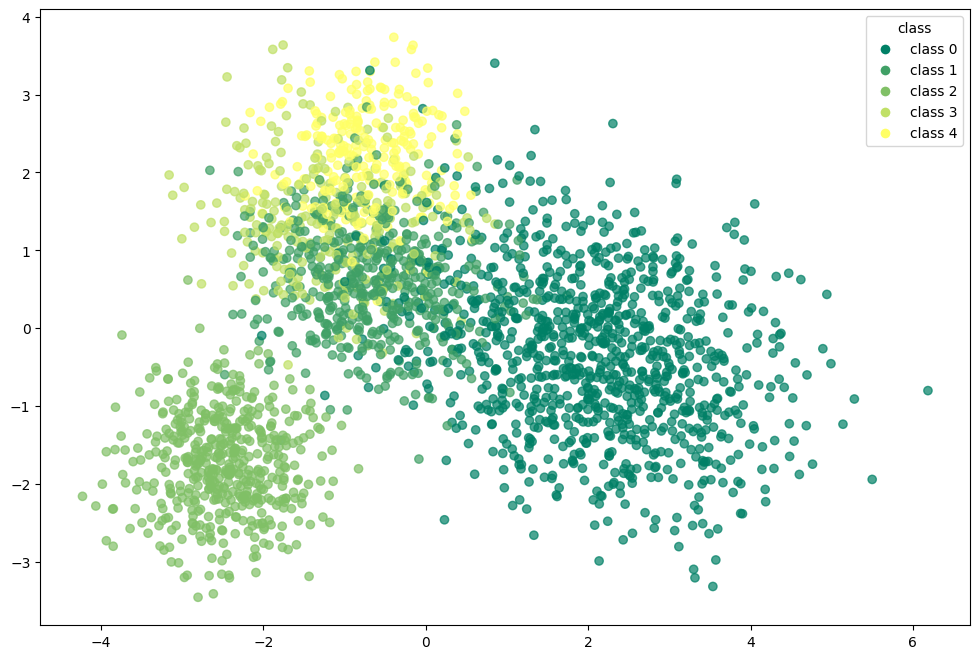

In [4194]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

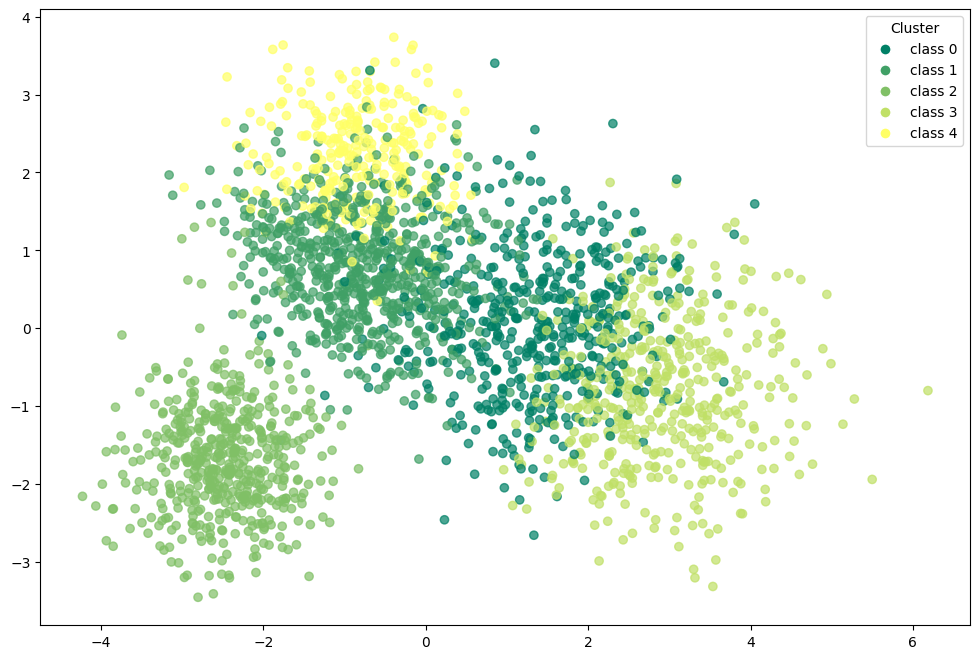

In [4195]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4196]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[516   6   0 478   0]
 [  0 496   4   0   0]
 [  0   0 500   0   0]
 [  0 195  10   0  45]
 [  0   0   0   0 250]]


In [4197]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.52      0.68      1000
           1       0.71      0.99      0.83       500
           2       0.97      1.00      0.99       500
           3       0.00      0.00      0.00       250
           4       0.85      1.00      0.92       250

    accuracy                           0.70      2500
   macro avg       0.71      0.70      0.68      2500
weighted avg       0.82      0.70      0.73      2500



In [4198]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.6595580165455678

In [4199]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.7964332077825044

In [4200]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.3236553226661825

### pam with t-SNE

In [4201]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [4202]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4203]:
pam_tsne = kmedoids(X_tsne.values.tolist(),initial_medoids,metric=metric)

In [4204]:
pam_tsne.process()

In [4205]:
clusters = pam_tsne.get_clusters()

In [4206]:
medoids = pam_tsne.get_medoids()

In [4207]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4208]:
df_pam_tsne = X_tsne.copy()

In [4209]:
df_pam_tsne['pam_tsne'] = labels

In [ ]:
df_pam_tsne['target'] = corr_dataset['target']

In [4210]:
df_pam_tsne

,dim_1,dim_2,dim_3,target,pam_tsne
0,-15.979687,7.722937,-2.993647,1,4.0
1,4.885467,13.854942,3.726759,0,2.0
2,9.337600,10.560486,7.206385,0,3.0
3,-21.735916,4.469969,-2.808877,1,4.0
4,6.096224,-3.138047,-9.427560,0,3.0
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,3.0
2496,5.619008,4.807449,-17.887569,4,0.0
2497,-9.478683,1.498881,-8.726512,1,4.0
2498,12.414795,-16.634073,2.181808,0,3.0


In [4211]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.0096
accuracy after: 0.9564


In [4212]:
df_pam_tsne

,dim_1,dim_2,dim_3,target,pam_tsne
0,-15.979687,7.722937,-2.993647,1,1
1,4.885467,13.854942,3.726759,0,3
2,9.337600,10.560486,7.206385,0,0
3,-21.735916,4.469969,-2.808877,1,1
4,6.096224,-3.138047,-9.427560,0,0
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,0
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,1,1
2498,12.414795,-16.634073,2.181808,0,0


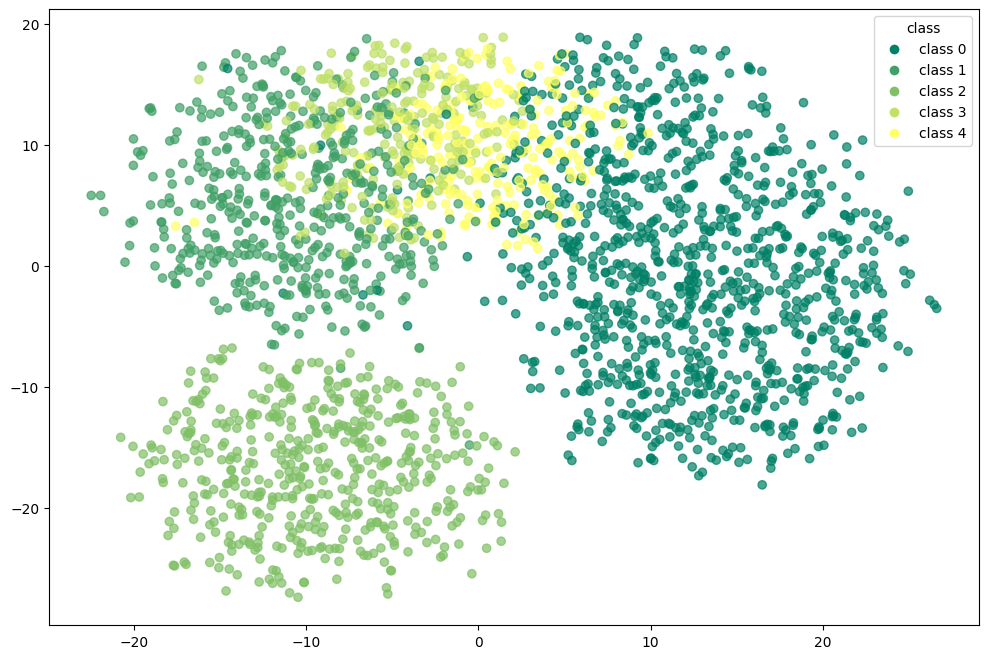

In [4213]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

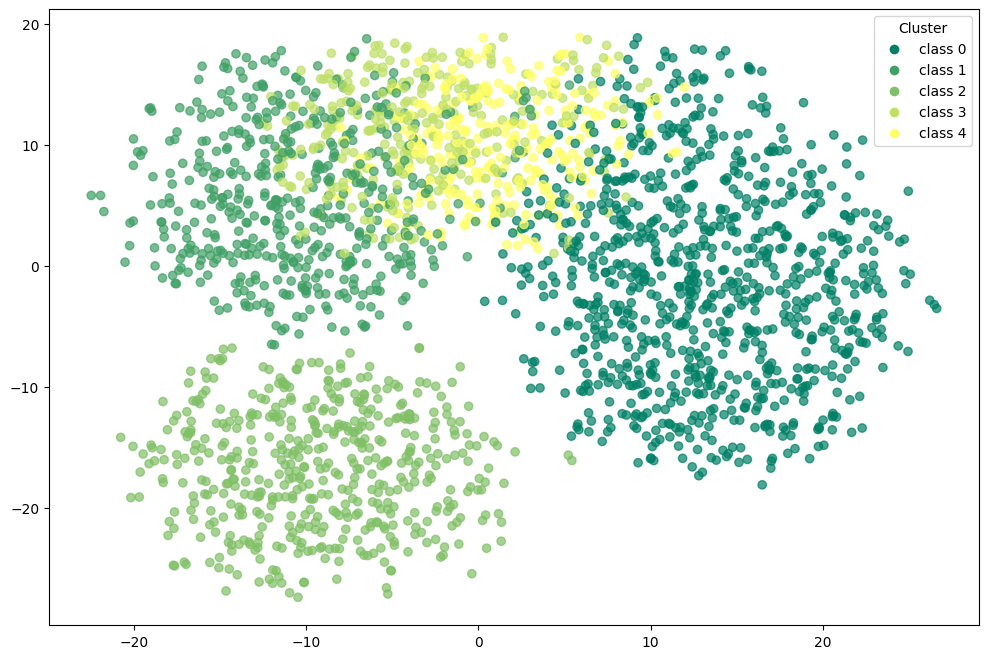

In [4214]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4215]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[908  21   2  51  18]
 [  0 489   3   3   5]
 [  0   1 499   0   0]
 [  0   1   0 248   1]
 [  0   3   0   0 247]]


In [4216]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95      1000
           1       0.95      0.98      0.96       500
           2       0.99      1.00      0.99       500
           3       0.82      0.99      0.90       250
           4       0.91      0.99      0.95       250

    accuracy                           0.96      2500
   macro avg       0.93      0.97      0.95      2500
weighted avg       0.96      0.96      0.96      2500



In [4217]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.8907586652155363

In [4218]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.8781275349999186

In [4219]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.4081307053565979

### pam with umap

In [4220]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [4221]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4222]:
pam_umap = kmedoids(X_umap.values.tolist(),initial_medoids,metric=metric)

In [4223]:
pam_umap.process()

In [4224]:
clusters = pam_umap.get_clusters()

In [4225]:
medoids = pam_umap.get_medoids()

In [4226]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4227]:
df_pam_umap = X_umap.copy()

In [4228]:
df_pam_umap['pam_umap'] = labels

In [ ]:
df_pam_umap['target'] = corr_dataset['target']

In [4229]:
df_pam_umap

,dim_1,dim_2,dim_3,target,pam_umap
0,1.388764,3.447327,4.915366,1,0.0
1,-0.225389,8.524396,5.733206,0,1.0
2,-0.600339,8.787193,5.004326,0,1.0
3,1.887043,3.825255,5.056378,1,0.0
4,0.174673,10.452823,5.602652,0,1.0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,0,1.0
2496,1.796548,1.624212,2.380335,4,3.0
2497,1.484902,3.208266,5.375015,1,0.0
2498,-0.758749,12.084641,4.810950,0,1.0


In [4230]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.2048
accuracy after: 0.9912


In [4231]:
df_pam_umap

,dim_1,dim_2,dim_3,target,pam_umap
0,1.388764,3.447327,4.915366,1,1
1,-0.225389,8.524396,5.733206,0,0
2,-0.600339,8.787193,5.004326,0,0
3,1.887043,3.825255,5.056378,1,1
4,0.174673,10.452823,5.602652,0,0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,0,0
2496,1.796548,1.624212,2.380335,4,4
2497,1.484902,3.208266,5.375015,1,1
2498,-0.758749,12.084641,4.810950,0,0


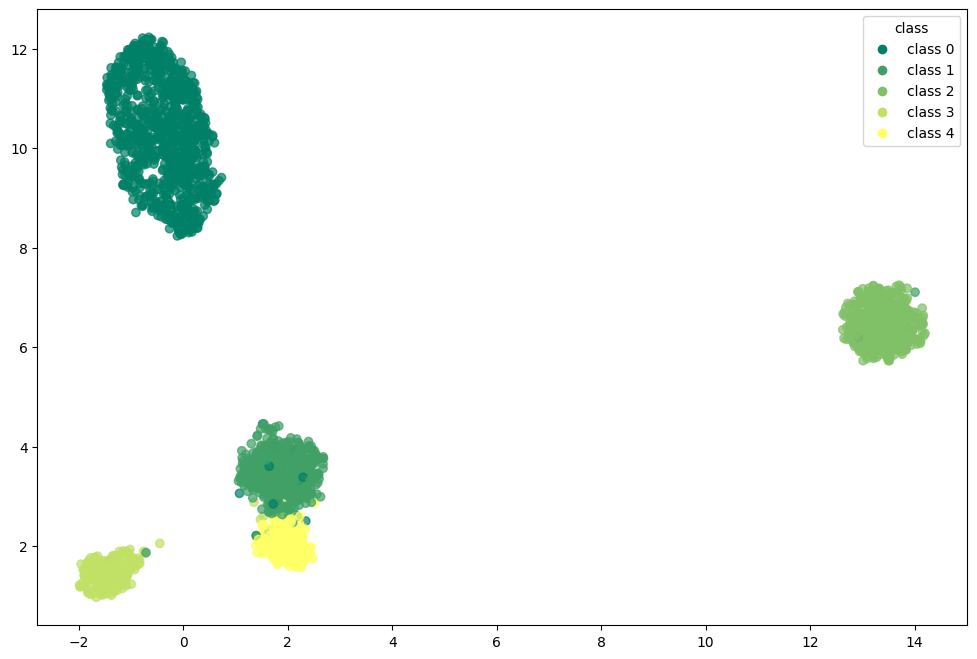

In [4232]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

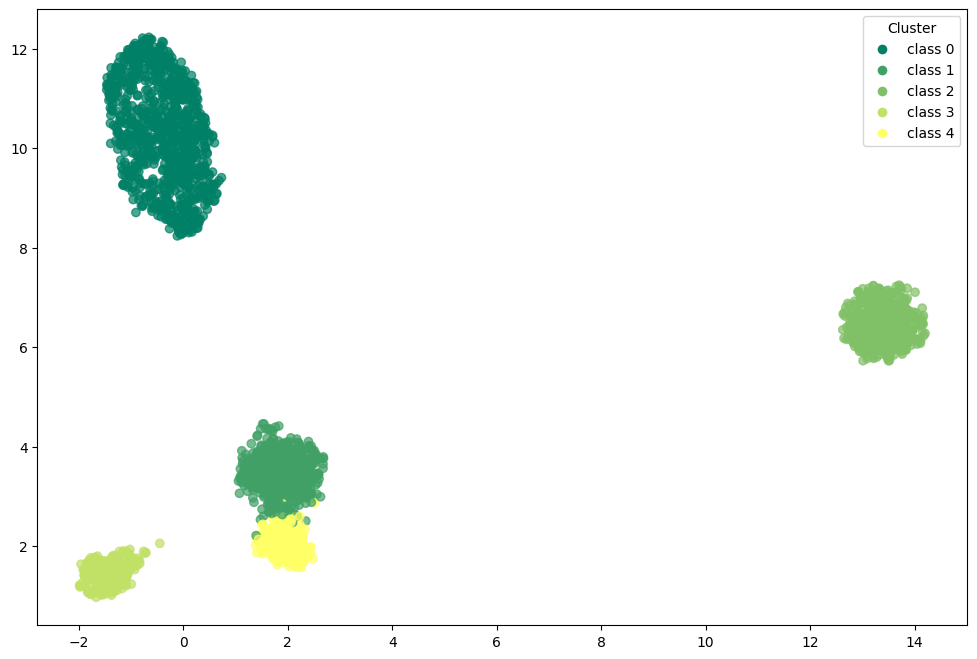

In [4233]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4234]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[988  12   0   0   0]
 [  0 495   3   2   0]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   0   0   0 250]]


In [4235]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.99      0.98       500
           2       0.99      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       1.00      1.00      1.00       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4236]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9778828506405981

In [4237]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9665904609431749

In [4238]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.7909843325614929

## spectral clustering

In [4239]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [4240]:
spectral_clustering.fit(X_values)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_spectral = X_values.copy()

In [4242]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [ ]:
df_spectral['target'] = corr_dataset['target']

In [4243]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_clustering
0,-6.641994,-9.479383,-7.434598,2.492461,-1.865350,7.075877,-2.966371,2.807489,-2.888920,2.098265,6.950932,-5.735315,3.753097,6.279267,-8.062613,1,0
1,12.502562,-5.620948,0.700777,17.218309,-16.709952,-14.189903,0.375504,-2.501210,0.934144,-2.360506,-3.200338,4.642565,1.568382,-3.604043,-9.088398,0,1
2,-5.327140,7.178955,2.638236,15.237030,-10.748420,-6.426675,-3.070219,-5.275808,2.792020,4.018719,-1.165848,4.045300,9.889787,1.503058,0.178747,0,1
3,-8.690757,-0.970090,-6.142113,5.643818,-8.319720,-2.670098,-10.946052,0.497044,-7.538764,2.522839,16.784253,-2.886515,3.697169,-0.844674,-17.387462,1,0
4,1.038843,6.617195,6.229649,-11.466775,-2.431297,-12.250299,-7.459043,1.145227,-1.318021,12.530790,-20.543895,-2.205635,11.635283,5.788768,-12.944699,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-4.323914,10.475535,10.579961,8.197395,-4.369989,-1.590170,-21.206878,18.753874,3.780466,-7.235630,-12.235339,9.245371,17.476246,-10.085070,-14.583853,0,1
2496,1.375572,-5.323044,18.983532,-5.766337,-11.150029,-4.594845,-5.718455,14.980603,-6.385750,2.799453,0.722406,0.547390,-13.518577,2.195069,13.547726,4,3
2497,-10.725040,-3.031160,-4.038208,5.173658,1.646877,5.965287,-16.512855,-0.452808,6.292858,-5.599518,8.997633,-11.524752,-3.456236,-5.172379,-7.442953,1,0
2498,-7.952903,15.180848,12.633699,-11.638983,0.096250,-10.570395,-22.374953,15.135183,-9.764437,-7.701657,-27.393980,16.685303,13.409274,-2.954037,-14.257059,0,1


In [4244]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.2024
accuracy after: 0.9904


In [4245]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_clustering
0,-6.641994,-9.479383,-7.434598,2.492461,-1.865350,7.075877,-2.966371,2.807489,-2.888920,2.098265,6.950932,-5.735315,3.753097,6.279267,-8.062613,1,1
1,12.502562,-5.620948,0.700777,17.218309,-16.709952,-14.189903,0.375504,-2.501210,0.934144,-2.360506,-3.200338,4.642565,1.568382,-3.604043,-9.088398,0,0
2,-5.327140,7.178955,2.638236,15.237030,-10.748420,-6.426675,-3.070219,-5.275808,2.792020,4.018719,-1.165848,4.045300,9.889787,1.503058,0.178747,0,0
3,-8.690757,-0.970090,-6.142113,5.643818,-8.319720,-2.670098,-10.946052,0.497044,-7.538764,2.522839,16.784253,-2.886515,3.697169,-0.844674,-17.387462,1,1
4,1.038843,6.617195,6.229649,-11.466775,-2.431297,-12.250299,-7.459043,1.145227,-1.318021,12.530790,-20.543895,-2.205635,11.635283,5.788768,-12.944699,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-4.323914,10.475535,10.579961,8.197395,-4.369989,-1.590170,-21.206878,18.753874,3.780466,-7.235630,-12.235339,9.245371,17.476246,-10.085070,-14.583853,0,0
2496,1.375572,-5.323044,18.983532,-5.766337,-11.150029,-4.594845,-5.718455,14.980603,-6.385750,2.799453,0.722406,0.547390,-13.518577,2.195069,13.547726,4,4
2497,-10.725040,-3.031160,-4.038208,5.173658,1.646877,5.965287,-16.512855,-0.452808,6.292858,-5.599518,8.997633,-11.524752,-3.456236,-5.172379,-7.442953,1,1
2498,-7.952903,15.180848,12.633699,-11.638983,0.096250,-10.570395,-22.374953,15.135183,-9.764437,-7.701657,-27.393980,16.685303,13.409274,-2.954037,-14.257059,0,0


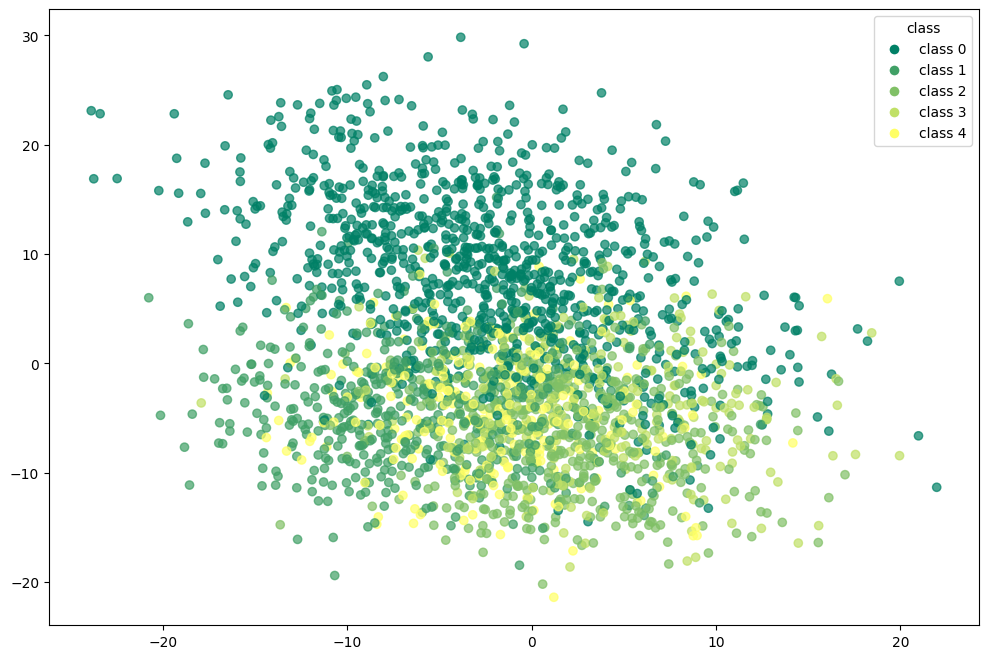

In [4246]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

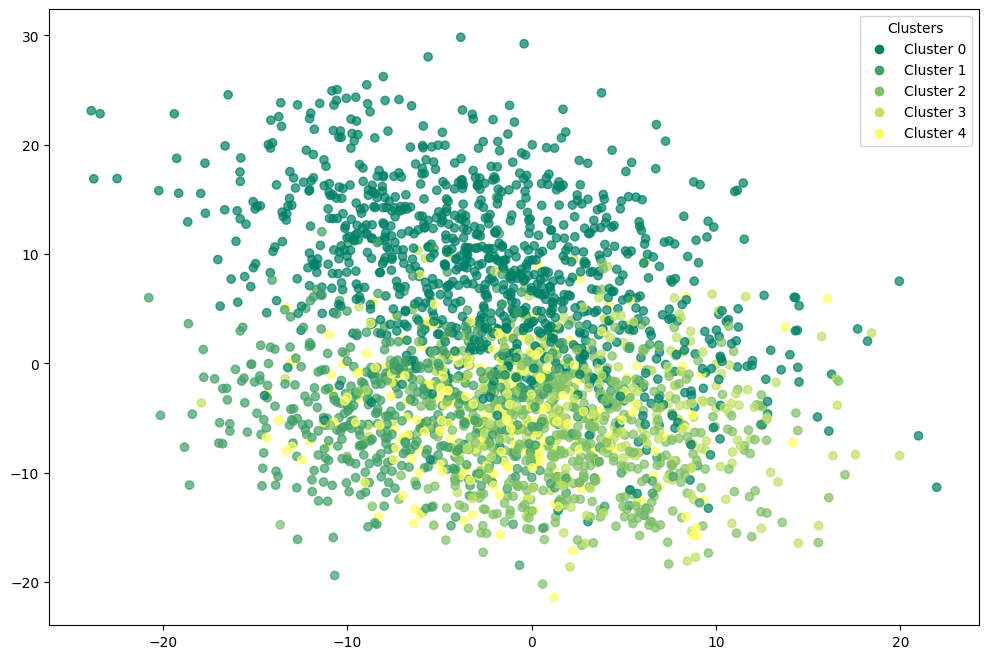

In [4247]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4248]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[993   6   0   0   1]
 [  0 493   2   1   4]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   5   0   0 245]]


In [4249]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1000
           1       0.97      0.99      0.98       500
           2       1.00      1.00      1.00       500
           3       1.00      0.98      0.99       250
           4       0.98      0.98      0.98       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4250]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9801542068300644

In [4251]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.961602601042326

In [4252]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.2200636365172688

### spectral clustering with pca

In [4253]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [4254]:
spectral_pca.fit(X_pca)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [4255]:
df_pca_spectral = X_pca.copy()

In [4256]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [ ]:
df_pca_spectral['target'] = corr_dataset['target']

In [4257]:
df_pca_spectral

,dim_1,dim_2,dim_3,dim_4,target,spectral_pca
0,-1.388603,0.465307,-1.143328,0.436212,1,3
1,-0.142474,-0.562371,2.396270,0.234201,0,4
2,0.687888,-0.425246,0.809689,-0.363627,0,4
3,-0.008288,0.578414,-1.665925,0.616777,1,3
4,1.986106,0.021519,-0.239403,-1.138866,0,1
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,0,1
2496,0.391958,3.015240,0.467748,-1.540382,4,2
2497,-0.966532,-0.242308,-1.591353,1.294384,1,3
2498,4.536698,-1.448120,-2.176720,-0.853220,0,1


In [4258]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.6996


In [4259]:
df_pca_spectral

,dim_1,dim_2,dim_3,dim_4,target,spectral_pca
0,-1.388603,0.465307,-1.143328,0.436212,1,1
1,-0.142474,-0.562371,2.396270,0.234201,0,0
2,0.687888,-0.425246,0.809689,-0.363627,0,0
3,-0.008288,0.578414,-1.665925,0.616777,1,1
4,1.986106,0.021519,-0.239403,-1.138866,0,4
...,...,...,...,...,...,...
2495,3.446848,-1.712653,-0.798079,1.181896,0,4
2496,0.391958,3.015240,0.467748,-1.540382,4,3
2497,-0.966532,-0.242308,-1.591353,1.294384,1,1
2498,4.536698,-1.448120,-2.176720,-0.853220,0,4


In [4260]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[500   3   0   0 497]
 [  0 499   1   0   0]
 [  0   0 500   0   0]
 [  0   0   0 250   0]
 [  0   0   0 250   0]]


In [4261]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67      1000
           1       0.99      1.00      1.00       500
           2       1.00      1.00      1.00       500
           3       0.50      1.00      0.67       250
           4       0.00      0.00      0.00       250

    accuracy                           0.70      2500
   macro avg       0.70      0.70      0.67      2500
weighted avg       0.85      0.70      0.73      2500



In [4262]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.7151390520499703

In [4263]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8583435499966395

In [4264]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.3090326476614952

### spectral clustering with t-SNE

In [4265]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [4266]:
spectral_tsne.fit(X_tsne)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [4267]:
df_tsne_spectral = X_tsne.copy()

In [4268]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [ ]:
df_tsne_spectral['target'] = corr_dataset['target']

In [4269]:
df_tsne_spectral

,dim_1,dim_2,dim_3,target,spectral_tsne
0,-15.979687,7.722937,-2.993647,1,0
1,4.885467,13.854942,3.726759,0,1
2,9.337600,10.560486,7.206385,0,1
3,-21.735916,4.469969,-2.808877,1,0
4,6.096224,-3.138047,-9.427560,0,1
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,1
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,1,0
2498,12.414795,-16.634073,2.181808,0,1


In [4270]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.1044
accuracy after: 0.9876


In [4271]:
df_tsne_spectral

,dim_1,dim_2,dim_3,target,spectral_tsne
0,-15.979687,7.722937,-2.993647,1,1
1,4.885467,13.854942,3.726759,0,0
2,9.337600,10.560486,7.206385,0,0
3,-21.735916,4.469969,-2.808877,1,1
4,6.096224,-3.138047,-9.427560,0,0
...,...,...,...,...,...
2495,10.308344,-13.613327,8.496574,0,0
2496,5.619008,4.807449,-17.887569,4,4
2497,-9.478683,1.498881,-8.726512,1,1
2498,12.414795,-16.634073,2.181808,0,0


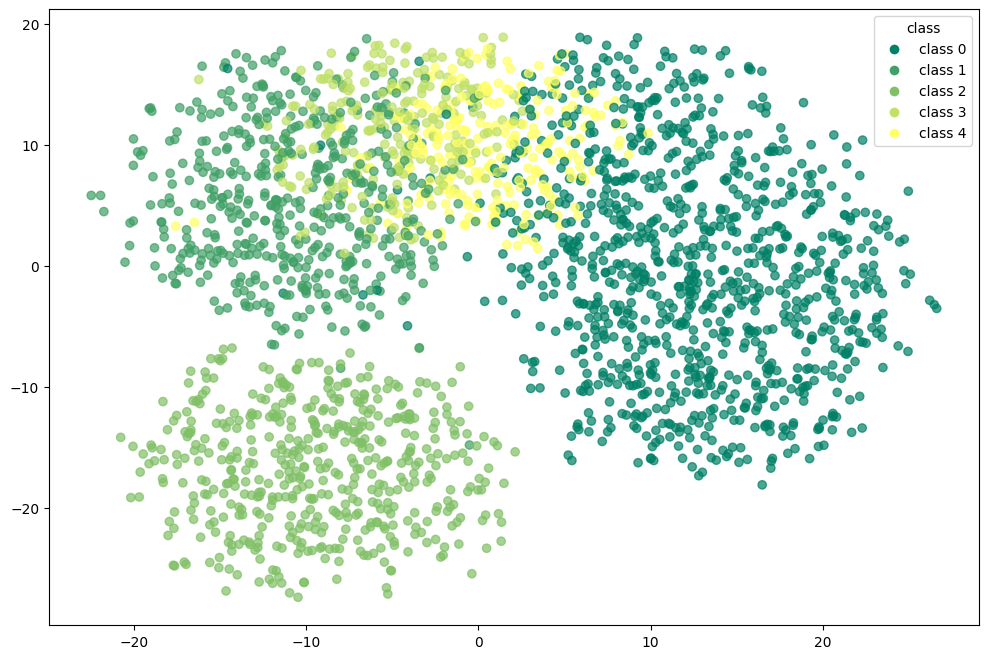

In [4272]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

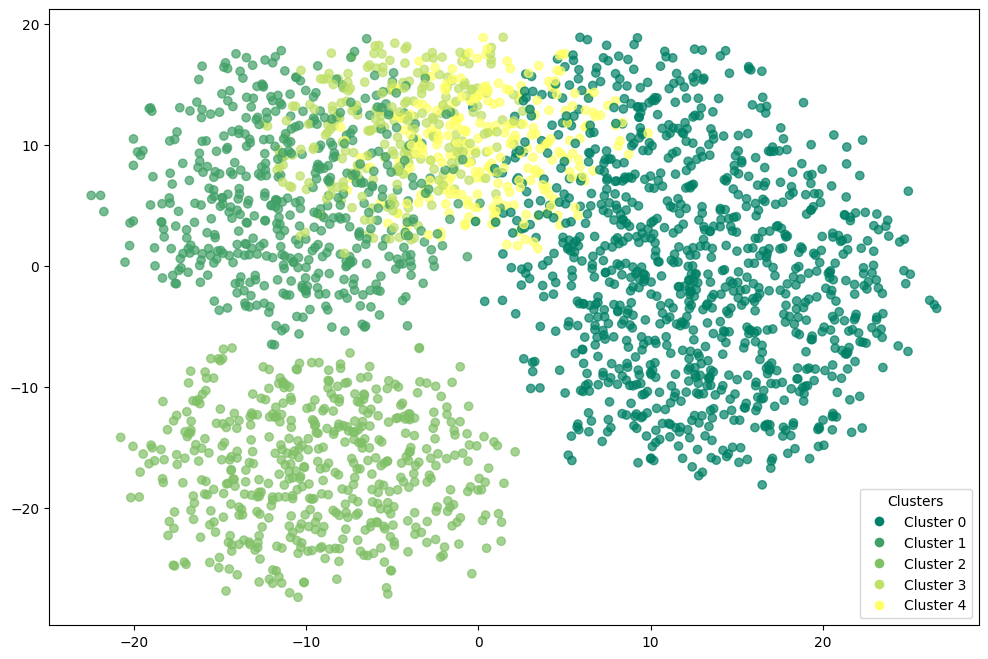

In [4273]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4274]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[985  13   0   0   2]
 [  1 490   3   2   4]
 [  1   0 499   0   0]
 [  0   1   0 248   1]
 [  0   3   0   0 247]]


In [4275]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1000
           1       0.97      0.98      0.97       500
           2       0.99      1.00      1.00       500
           3       0.99      0.99      0.99       250
           4       0.97      0.99      0.98       250

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4276]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9703026896387191

In [4277]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9521338821602108

In [4278]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.4092605412006378

### spectral clustering with umap

In [4279]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [4280]:
spectral_umap.fit(X_umap)

,n_clusters,5
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [4569]:
df_umap_spectral = X_umap.copy()

In [4570]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [4572]:
df_umap_spectral['target'] = corr_dataset['target']

In [4573]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,1.388764,3.447327,4.915366,1,1
1,-0.225389,8.524396,5.733206,0,0
2,-0.600339,8.787193,5.004326,0,0
3,1.887043,3.825255,5.056378,1,1
4,0.174673,10.452823,5.602652,3,0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,4,0
2496,1.796548,1.624212,2.380335,2,4
2497,1.484902,3.208266,5.375015,1,1
2498,-0.758749,12.084641,4.810950,4,0


In [4574]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.3944
accuracy after: 0.5092


In [4575]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,1.388764,3.447327,4.915366,2,1
1,-0.225389,8.524396,5.733206,1,0
2,-0.600339,8.787193,5.004326,1,0
3,1.887043,3.825255,5.056378,2,1
4,0.174673,10.452823,5.602652,0,0
...,...,...,...,...,...
2495,-1.377613,11.473056,4.688684,3,0
2496,1.796548,1.624212,2.380335,4,4
2497,1.484902,3.208266,5.375015,2,1
2498,-0.758749,12.084641,4.810950,3,0


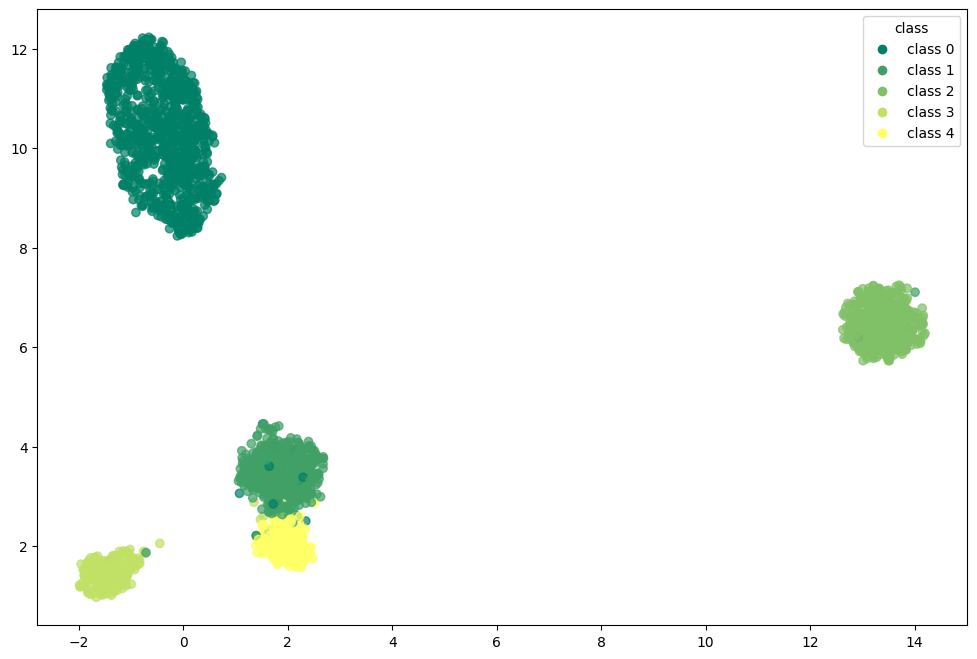

In [4576]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

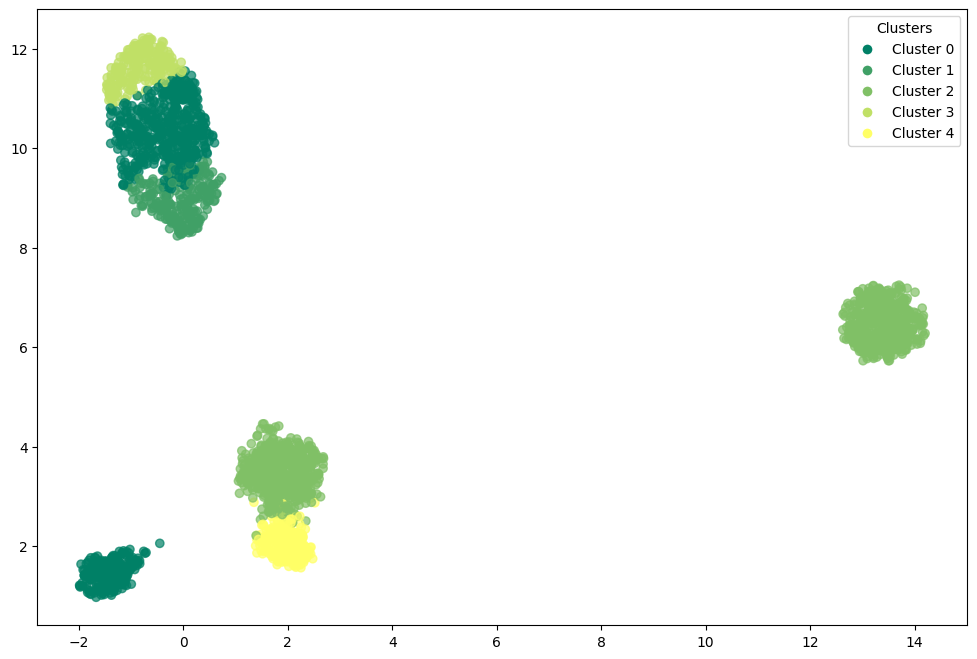

In [4577]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4578]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[524 242  12 222   0]
 [  2   0 498   0   0]
 [  0   1 499   0   0]
 [246   0   2   0   2]
 [  0   0   0   0 250]]


In [4579]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       0.68      0.52      0.59      1000
           1       0.00      0.00      0.00       500
           2       0.49      1.00      0.66       500
           3       0.00      0.00      0.00       250
           4       0.99      1.00      1.00       250

    accuracy                           0.51      2500
   macro avg       0.43      0.50      0.45      2500
weighted avg       0.47      0.51      0.47      2500



In [4580]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.431907905831315

In [4581]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.6661220358482508

In [4582]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.07518991827964783

# accuracy and confusion matrix 

## k-means

In [4293]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1000
           1       0.97      0.97      0.97       500
           2       0.99      1.00      1.00       500
           3       0.91      0.99      0.95       250
           4       0.87      1.00      0.93       250

    accuracy                           0.97      2500
   macro avg       0.95      0.98      0.96      2500
weighted avg       0.97      0.97      0.97      2500



In [4294]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[942   9   1  20  28]
 [  1 485   3   3   8]
 [  0   0 500   0   0]
 [  0   3   0 247   0]
 [  0   1   0   0 249]]


## k-menas + pca

In [4295]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67      1000
           1       0.66      0.98      0.79       500
           2       0.99      1.00      0.99       500
           3       0.00      0.00      0.00       250
           4       1.00      1.00      1.00       250

    accuracy                           0.70      2500
   macro avg       0.73      0.70      0.69      2500
weighted avg       0.83      0.70      0.72      2500



In [4296]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[503   4   0 493   0]
 [  0 490   5   5   0]
 [  0   0 500   0   0]
 [  0 249   1   0   0]
 [  0   0   0   0 250]]


## k-means + t-SNE

In [4297]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.82      0.90      1000
           1       0.97      0.95      0.96       500
           2       0.99      1.00      0.99       500
           3       0.63      0.99      0.77       250
           4       0.84      0.99      0.91       250

    accuracy                           0.92      2500
   macro avg       0.89      0.95      0.91      2500
weighted avg       0.94      0.92      0.92      2500



In [4298]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[821  11   2 135  31]
 [  0 473   3   7  17]
 [  0   0 499   1   0]
 [  0   1   0 248   1]
 [  0   2   0   0 248]]


## k-means + UMAP

In [4299]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.99      0.98       500
           2       0.99      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       1.00      1.00      1.00       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4300]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[988  12   0   0   0]
 [  0 495   3   2   0]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   0   0   0 250]]


## Birch

In [4301]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.99      0.51      0.67      1000
           1       0.64      0.98      0.78       500
           2       1.00      1.00      1.00       500
           3       0.98      0.96      0.97       250
           4       0.00      0.00      0.00       250

    accuracy                           0.70      2500
   macro avg       0.72      0.69      0.68      2500
weighted avg       0.82      0.70      0.72      2500



In [4302]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[507  16   0   1 476]
 [  5 491   0   3   1]
 [  0   0 499   0   1]
 [  2   8   0 240   0]
 [  0 248   0   1   1]]


## Birch + pca

In [4303]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       1.00      0.65      0.79      1000
           1       0.00      0.00      0.00       500
           2       0.50      1.00      0.67       500
           3       1.00      1.00      1.00       250
           4       1.00      1.00      1.00       250

    accuracy                           0.66      2500
   macro avg       0.70      0.73      0.69      2500
weighted avg       0.70      0.66      0.65      2500



In [4304]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[647 349   4   0   0]
 [  1   0 498   1   0]
 [  0   0 500   0   0]
 [  0   0   0 249   1]
 [  0   0   0   0 250]]


## Birch + t-SNE

In [4305]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1000
           1       0.95      0.98      0.96       500
           2       1.00      1.00      1.00       500
           3       0.99      0.96      0.98       250
           4       0.97      0.98      0.98       250

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [4306]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[985  13   0   0   2]
 [  2 490   2   2   4]
 [  2   0 498   0   0]
 [  0   8   0 241   1]
 [  0   5   0   0 245]]


## Birch + UMAP

In [4307]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.99      0.98       500
           2       0.99      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       1.00      1.00      1.00       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4308]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[988  12   0   0   0]
 [  0 495   3   2   0]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   0   0   0 250]]


## GMM

In [4309]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1000
           1       0.99      0.78      0.87       500
           2       1.00      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       0.70      1.00      0.82       250

    accuracy                           0.95      2500
   macro avg       0.93      0.95      0.93      2500
weighted avg       0.96      0.95      0.95      2500



In [4310]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[997   1   0   1   1]
 [  4 389   2   1 104]
 [  1   0 499   0   0]
 [  3   0   0 245   2]
 [  0   1   0   0 249]]


## GMM + pca

In [4311]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.52      0.69      1000
           1       0.67      1.00      0.80       500
           2       1.00      1.00      1.00       500
           3       0.00      0.00      0.00       250
           4       1.00      1.00      1.00       250

    accuracy                           0.71      2500
   macro avg       0.73      0.70      0.70      2500
weighted avg       0.83      0.71      0.73      2500



In [4312]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[522   0   0 478   0]
 [  0 500   0   0   0]
 [  0   0 500   0   0]
 [  0 250   0   0   0]
 [  0   0   0   0 250]]


## GMM + t-SNE

In [4313]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00       500
           2       1.00      1.00      1.00       500
           3       1.00      1.00      1.00       250
           4       1.00      1.00      1.00       250

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [4314]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1000    0    0    0    0]
 [   0  500    0    0    0]
 [   0    0  500    0    0]
 [   0    0    0  250    0]
 [   0    0    0    0  250]]


## GMM + UMAP

In [4315]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.99      0.98       500
           2       0.99      1.00      1.00       500
           3       1.00      0.98      0.99       250
           4       1.00      1.00      1.00       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [4316]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[988  12   0   0   0]
 [  0 497   3   0   0]
 [  0   1 499   0   0]
 [  0   4   0 246   0]
 [  0   0   0   0 250]]


## PAM

In [4317]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[579  35   0  13 373]
 [  1 470   3  26   0]
 [  1   0 499   0   0]
 [  1   1   0 248   0]
 [ 62 140   1  47   0]]


In [4318]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.90      0.58      0.70      1000
           1       0.73      0.94      0.82       500
           2       0.99      1.00      1.00       500
           3       0.74      0.99      0.85       250
           4       0.00      0.00      0.00       250

    accuracy                           0.72      2500
   macro avg       0.67      0.70      0.67      2500
weighted avg       0.78      0.72      0.73      2500



## PAM + pca

In [4319]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[516   6   0 478   0]
 [  0 496   4   0   0]
 [  0   0 500   0   0]
 [  0 195  10   0  45]
 [  0   0   0   0 250]]


In [4320]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.52      0.68      1000
           1       0.71      0.99      0.83       500
           2       0.97      1.00      0.99       500
           3       0.00      0.00      0.00       250
           4       0.85      1.00      0.92       250

    accuracy                           0.70      2500
   macro avg       0.71      0.70      0.68      2500
weighted avg       0.82      0.70      0.73      2500



## PAM + t-SNE

In [4321]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[908  21   2  51  18]
 [  0 489   3   3   5]
 [  0   1 499   0   0]
 [  0   1   0 248   1]
 [  0   3   0   0 247]]


In [4322]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95      1000
           1       0.95      0.98      0.96       500
           2       0.99      1.00      0.99       500
           3       0.82      0.99      0.90       250
           4       0.91      0.99      0.95       250

    accuracy                           0.96      2500
   macro avg       0.93      0.97      0.95      2500
weighted avg       0.96      0.96      0.96      2500



## PAM + umap

In [4323]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[988  12   0   0   0]
 [  0 495   3   2   0]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   0   0   0 250]]


In [4324]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1000
           1       0.97      0.99      0.98       500
           2       0.99      1.00      1.00       500
           3       0.99      0.98      0.99       250
           4       1.00      1.00      1.00       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



## spectral clustering

In [4325]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[993   6   0   0   1]
 [  0 493   2   1   4]
 [  1   0 499   0   0]
 [  0   3   0 246   1]
 [  0   5   0   0 245]]


In [4326]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1000
           1       0.97      0.99      0.98       500
           2       1.00      1.00      1.00       500
           3       1.00      0.98      0.99       250
           4       0.98      0.98      0.98       250

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



## spectral clustering + pca

In [4327]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[500   3   0   0 497]
 [  0 499   1   0   0]
 [  0   0 500   0   0]
 [  0   0   0 250   0]
 [  0   0   0 250   0]]


In [4328]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67      1000
           1       0.99      1.00      1.00       500
           2       1.00      1.00      1.00       500
           3       0.50      1.00      0.67       250
           4       0.00      0.00      0.00       250

    accuracy                           0.70      2500
   macro avg       0.70      0.70      0.67      2500
weighted avg       0.85      0.70      0.73      2500



## spectral clustering + t-SNE

In [4329]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[985  13   0   0   2]
 [  1 490   3   2   4]
 [  1   0 499   0   0]
 [  0   1   0 248   1]
 [  0   3   0   0 247]]


In [4330]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1000
           1       0.97      0.98      0.97       500
           2       0.99      1.00      1.00       500
           3       0.99      0.99      0.99       250
           4       0.97      0.99      0.98       250

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



## spectral clustering + umap

In [4331]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[524 242  12 222   0]
 [  2   0 498   0   0]
 [  0   1 499   0   0]
 [246   0   2   0   2]
 [  0   0   0   0 250]]


In [4332]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       0.68      0.52      0.59      1000
           1       0.00      0.00      0.00       500
           2       0.49      1.00      0.66       500
           3       0.00      0.00      0.00       250
           4       0.99      1.00      1.00       250

    accuracy                           0.51      2500
   macro avg       0.43      0.50      0.45      2500
weighted avg       0.47      0.51      0.47      2500



# external measures  

## k-means

In [4333]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [4334]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.925
NMI: 0.904
Silhouette: 0.222


## k-means + pca

In [4335]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [4336]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.660
NMI: 0.823
Silhouette: 0.329


## k-means + tsne

In [4337]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [4338]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.803
NMI: 0.824
Silhouette: 0.404


## k-means + umap

In [4339]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [4340]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.978
NMI: 0.967
Silhouette: 0.791


##  Birch 

In [4341]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [4342]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.640
NMI: 0.791
Silhouette: 0.195


## Birch + pca

In [4343]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [4344]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.600
NMI: 0.804
Silhouette: 0.284


## Birch + tsne

In [4345]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [4346]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.963
NMI: 0.939
Silhouette: 0.406


## Birch + umap

In [4347]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [4348]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.978
NMI: 0.967
Silhouette: 0.791


## GMM

In [4349]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [4350]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.928
NMI: 0.907
Silhouette: 0.205


## GMM + pca

In [4351]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [4352]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.672
NMI: 0.845
Silhouette: 0.310


## GMM + tsne

In [4353]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [4354]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 1.000
NMI: 1.000
Silhouette: 0.400


## GMM + umap

In [4355]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [4356]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.979
NMI: 0.971
Silhouette: 0.787


## pam

In [4357]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [4358]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.605
NMI: 0.704
Silhouette: 0.177


## pam + pca

In [4359]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [4360]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.660
NMI: 0.796
Silhouette: 0.324


## pam + tsne

In [4361]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [4362]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.891
NMI: 0.878
Silhouette: 0.408


## pca + umap

In [4363]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [4364]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.978
NMI: 0.967
Silhouette: 0.791


## spectral clustering

In [4365]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [4366]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.980
NMI: 0.962
Silhouette: 0.220


## spectral clustering + pca

In [4367]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [4368]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.715
NMI: 0.858
Silhouette: 0.309


## spectral clustering + tsne

In [4369]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [4370]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.970
NMI: 0.952
Silhouette: 0.409


## spectral clustering + umap

In [4371]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [4372]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.432
NMI: 0.666
Silhouette: 0.075


# final output

In [4373]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.925  0.904       0.222
k-means + pca               0.660  0.823       0.329
k-means + tsne              0.803  0.824       0.404
k-means + umap              0.978  0.967       0.791
Birch                       0.640  0.791       0.195
Birch + pca                 0.600  0.804       0.284
Birch + tsne                0.963  0.939       0.406
Birch + umap                0.978  0.967       0.791
GMM                         0.928  0.907       0.205
GMM + pca                   0.672  0.845       0.310
GMM + tsne                  1.000  1.000       0.400
GMM + umap                  0.979  0.971       0.787
PAM                         0.605  0.704       0.177
PAM + pca                   0.660  0.796       0.324
PAM + tsne                  0.891  0.878       0.408
PAM + umap                  0.978  0.967       0.791
Spectral Clustering         0.980  0.962       0.220
Spectral Clustering + pca   0.715  0.858      

In [4374]:
if N_SAMPLE == 2500 and N_FEATURES == 15:
    folder = "2500_15"
elif N_SAMPLE == 5000 and N_FEATURES == 10:
    folder = "5000_10"
elif N_SAMPLE == 10000 and N_FEATURES == 5:
    folder = "10000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)

## ARI index

In [4375]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4376]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4377]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4378]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [4379]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4380]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4381]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4382]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [4383]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4384]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4385]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4386]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [4387]:
ari = {}

In [4388]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 10'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 7.5'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 5'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 10'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 7.5'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 5'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 10'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 7.5'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 5'):df_7_cluster['ARI'].values,
        }
)

In [4389]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4390]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"ari_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [4391]:
ari_2500_15 = pd.read_csv("ari_2500_15.csv", header=[0,1,2])

In [4392]:
ari_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4393]:
ari_5000_10 = pd.read_csv("ari_5000_10.csv", header=[0,1,2])

In [4394]:
ari_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4395]:
ari_10000_5 = pd.read_csv("ari_10000_5.csv", header=[0,1,2])

In [4396]:
ari_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## NMI index

In [4397]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4398]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4399]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4400]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [4401]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4402]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4403]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4404]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [4405]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4406]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4407]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4408]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [4409]:
nmi = {}

In [4410]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 10'):df_3_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 7.5'):df_3_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 5'):df_3_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 10'):df_5_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 7.5'):df_5_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 5'):df_5_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 10'):df_7_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 7.5'):df_7_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 5'):df_7_cluster['NMI'].values,
        }
)

In [4411]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4412]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"nmi_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [4413]:
nmi_2500_15 = pd.read_csv("nmi_2500_15.csv", header=[0,1,2])

In [4414]:
nmi_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4415]:
nmi_5000_10 = pd.read_csv("nmi_5000_10.csv", header=[0,1,2])

In [4416]:
nmi_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4417]:
nmi_10000_5 = pd.read_csv("nmi_10000_5.csv", header=[0,1,2])

In [4418]:
nmi_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## Silhouette score 

In [4419]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4420]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4421]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4422]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [4423]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4424]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4425]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4426]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [4427]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4428]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4429]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [4430]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [4431]:
silhouette = {}

In [4432]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 10'):df_3_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 7.5'):df_3_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 5'):df_3_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 10'):df_5_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 7.5'):df_5_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 5'):df_5_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 10'):df_7_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 7.5'):df_7_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 5'):df_7_cluster['Silhouette'].values,
        }
)

In [4433]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4434]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"silhouette_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [4435]:
silhouette_2500_15 = pd.read_csv("silhouette_2500_15.csv", header=[0,1,2])

In [4436]:
silhouette_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4437]:
# silhouette_5000_10 = pd.read_csv("silhouette_5000_10.csv", header=[0,1,2])

In [4438]:
# silhouette_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [4439]:
# silhouette_10000_5 = pd.read_csv("silhouette_10000_5.csv", header=[0,1,2])

In [4440]:
# silhouette_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])